In [ ]:
!pip install pmdarima

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import pandas as pd
import numpy as np

import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

pd.options.display.float_format = '{:,.3f}'.format

In [ ]:
# Mount data from drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


#1 Analisis exploratorio de los datos

## 1.1. Descripción de las variables



*   **DL_Traffic:** Volumen de tráfico enviado desde la red a los clientes [MBytes]
*   **User_Active_DL_Avg:** Cantidad de clientes activos promedios. Estos clientes son los que se encuentran traficando, a diferencia de un cliente conectado que es aquel que el telefono si bien esta conectado no se encuentra en actividad.
* **Throughput_User_Dl:** Velocidad de bajada promedio por usuario 



In [ ]:
path_file='/content/drive/MyDrive/maestria/materias/Series temporales/TP_2/dataset.csv'

df = pd.read_csv(path_file,sep=';') 
df.rename(columns = {'PERIOD_START_TIME':'timepo_15min'}, inplace = True)
df.drop(columns=['LNCEL_NAME'],inplace=True)
#Convierto el tiempo en el tipo de variable datetime
df['timepo_15min'] = pd.to_datetime(df['timepo_15min'], dayfirst = True) 
print(df.dtypes)
# Lo pongo como indice
df.set_index("timepo_15min", inplace=True)
# Geenra un eje temporal sin huecos
df=df.asfreq(freq='15min',method='ffill')

df.head(3)

timepo_15min          datetime64[ns]
DL_Traffic                   float64
User_Active_DL_Avg           float64
Throughput_User_Dl           float64
dtype: object


,DL_Traffic,User_Active_DL_Avg,Throughput_User_Dl
timepo_15min,,,
2022-07-19 00:00:00,215.099,0.450,13.075
2022-07-19 00:15:00,366.456,0.585,13.175
2022-07-19 00:30:00,464.536,0.572,12.788


##1.2. Series

In [ ]:
fig = make_subplots(rows=3, cols=1)

fig.add_trace(go.Scatter(x=df.index,y=df['DL_Traffic'], mode='lines',name='DL_Traffic'),row=1, col=1)
fig.add_trace(go.Scatter(x=df.index,y=df['User_Active_DL_Avg'], mode='lines',name='User_Active_DL_Avg'),row=2, col=1)
fig.add_trace(go.Scatter(x=df.index,y=df['Throughput_User_Dl'], mode='lines',name='Throughput_User_Dl'),row=3, col=1)

fig.update_layout(height=800, width=1200, title_text="Relaciones",legend=dict(orientation="h",yanchor="bottom", y=1.02,xanchor="right",x=1))

fig.update_xaxes(title_text="DL_Traffic", row=1, col=1)
fig.update_xaxes(title_text="User_Active_DL_Avg", row=2, col=1)
fig.update_xaxes(title_text="Throughput_User_Dl", row=3, col=1)

fig.update_yaxes(title_text="[MBytes]", row=1, col=1)
fig.update_yaxes(title_text="[usuarios]", row=2, col=1)
fig.update_yaxes(title_text="[Kbps]", row=3, col=1)
fig.show()

## 1.3. Relación entre ellas

In [ ]:
fig = make_subplots(rows=1, cols=3)

fig.add_trace(go.Scatter(x=df['DL_Traffic'], y=df['Throughput_User_Dl'],mode='markers',name='DL_Traffic'),row=1, col=1)
fig.add_trace(go.Scatter(x=df['User_Active_DL_Avg'], y=df['Throughput_User_Dl'],mode='markers',name='User_Active_DL_Avg'),row=1, col=2)
fig.add_trace(go.Scatter(x=df['User_Active_DL_Avg'], y=df['DL_Traffic'],mode='markers',name='User_Active_DL_Avg'),row=1, col=3)

fig.update_layout(height=600, width=1200, title_text="Relaciones",legend=dict(orientation="h",yanchor="bottom", y=1.02,xanchor="right",x=1))

fig.update_yaxes(title_text="Throughput_User_Dl", row=1, col=1)
fig.update_yaxes(title_text="Throughput_User_Dl", row=1, col=2)
fig.update_yaxes(title_text="DL_Traffic", row=1, col=3)

fig.update_xaxes(title_text="DL_Traffic", row=1, col=1)
fig.update_xaxes(title_text="User_Active_DL_Avg", row=1, col=2)
fig.update_xaxes(title_text="User_Active_DL_Avg", row=1, col=3)
fig.show()

##1.4 Función de distribución

In [ ]:
fig = make_subplots(rows=1, cols=3)

fig.add_trace(go.Histogram(x=df['DL_Traffic'],histnorm='percent',name='DL_Traffic'),row=1, col=1)
fig.add_trace(go.Histogram(x=df['User_Active_DL_Avg'],histnorm='percent',name='User_Active_DL_Avg'),row=1, col=2)
fig.add_trace(go.Histogram(x=df['Throughput_User_Dl'],histnorm='percent',name='Throughput_User_Dl'),row=1, col=3)

fig.update_layout(height=600, width=1200, title_text="Distribuciones",showlegend=False)

fig.update_xaxes(title_text="DL_Traffic", row=1, col=1)
fig.update_xaxes(title_text="User_Active_DL_Avg", row=1, col=2)
fig.update_xaxes(title_text="Throughput_User_Dl", row=1, col=3)
fig.show()

##1.5. Estacionariedad

In [ ]:
fig = make_subplots(rows=3, cols=2)

fig.add_trace(go.Scatter(x=df.index,y=df['DL_Traffic'], mode='lines',name='DL_Traffic'),row=1, col=1)
fig.add_trace(go.Scatter(x=df.index,y=df['User_Active_DL_Avg'], mode='lines',name='User_Active_DL_Avg'),row=2, col=1)
fig.add_trace(go.Scatter(x=df.index,y=df['Throughput_User_Dl'], mode='lines',name='Throughput_User_Dl'),row=3, col=1)

fig.add_trace(go.Scatter(x=df.index,y=df['DL_Traffic'].rolling(4*24).mean(), mode='lines',line=dict(color='black')),row=1, col=1)
fig.add_trace(go.Scatter(x=df.index,y=df['DL_Traffic'].rolling(4*24).std(), mode='lines',line=dict(color='black')),row=1, col=2)

fig.add_trace(go.Scatter(x=df.index,y=df['User_Active_DL_Avg'].rolling(4*24).mean(), mode='lines',line=dict(color='black')),row=2, col=1)
fig.add_trace(go.Scatter(x=df.index,y=df['User_Active_DL_Avg'].rolling(4*24).std(), mode='lines',line=dict(color='black')),row=2, col=2)

fig.add_trace(go.Scatter(x=df.index,y=df['Throughput_User_Dl'].rolling(4*24).mean(), mode='lines',line=dict(color='black')),row=3, col=1)
fig.add_trace(go.Scatter(x=df.index,y=df['Throughput_User_Dl'].rolling(4*24).std(), mode='lines',line=dict(color='black')),row=3, col=2)

fig.update_layout(height=800, width=1200, title_text="Relaciones",showlegend=False)
fig.update_yaxes(title_text="Tráfico [MBytes]", row=1, col=1)
fig.update_yaxes(title_text="Usuarios activos", row=2, col=1)
fig.update_yaxes(title_text="Throughput [Kbps]", row=3, col=1)
fig.show()

#2 Box Cox - Estabilizacion de la varianza

In [ ]:
from scipy.special import inv_boxcox
from scipy.stats import boxcox

y =

      | (x**lmbda - 1) / lmbda,  for lmbda != 0
      | log(x),                  for lmbda = 0


**References**
G.E.P. Box and D.R. Cox, "An Analysis of Transformations", Journal of the Royal Statistical Society B, 26, 211-252 (1964)

In [ ]:
df['boxcox_DL_Traffic'], lam_traffic = boxcox(df['DL_Traffic'])
df['boxcox_User_Active_DL_Avg'], lam_user = boxcox(df['User_Active_DL_Avg'])
df['boxcox_Throughput_User_Dl'], lam_thp = boxcox(df['Throughput_User_Dl'])

print("Las Lambdas de las transformaciones son:\n\n*Trafico: {0}\n*Usuarios activos: {1}\n*Throughput: {2}:".format(lam_traffic,lam_user,lam_thp))

Las Lambdas de las transformaciones son:

*Trafico: 0.5154708194825727
*Usuarios activos: 0.35508513704786654
*Throughput: -0.06755787139326795:


In [ ]:
fig = make_subplots(rows=1, cols=3)

fig.add_trace(go.Histogram(x=df['boxcox_DL_Traffic'],histnorm='percent'),row=1, col=1)
fig.add_trace(go.Histogram(x=df['boxcox_User_Active_DL_Avg'],histnorm='percent'),row=1, col=2)
fig.add_trace(go.Histogram(x=df['boxcox_Throughput_User_Dl'],histnorm='percent'),row=1, col=3)

fig.update_layout(height=600, width=1200, title_text="Tranformadas Box Cox",showlegend=False)

fig.update_xaxes(title_text="DL_Traffic", row=1, col=1)
fig.update_xaxes(title_text="User_Active_DL_Avg", row=1, col=2)
fig.update_xaxes(title_text="Throughput_User_Dl", row=1, col=3)
fig.show()

In [ ]:
fig = make_subplots(rows=1, cols=1)

fig.add_trace(go.Scatter(x=df.index,y=df['DL_Traffic'].rolling(4*24).std(), mode='lines',yaxis='y1',name='Original'))
fig.add_trace(go.Scatter(x=df.index,y=df['boxcox_DL_Traffic'].rolling(4*24).std(), mode='lines',name='Box Cox',line=dict(color='black'),yaxis='y2'))

# fig.update_xaxes(title_text="Tráfico [MBytes]", row=1, col=1)
fig.update_layout(height=400, width=800, title_text="Tráfico| STD Original vs Box Cox",yaxis=dict(title="Original axis"),
                  legend=dict(orientation="h",yanchor="bottom",y=1.02,xanchor="right",x=1),
                  yaxis2=dict(title="Box-Cox axis",overlaying="y",side="right"))

fig.show()

In [ ]:
fig = make_subplots(rows=1, cols=1)

fig.add_trace(go.Scatter(x=df.index,y=df['User_Active_DL_Avg'].rolling(4*24).std(), mode='lines',yaxis='y1',name='Original'))
fig.add_trace(go.Scatter(x=df.index,y=df['boxcox_User_Active_DL_Avg'].rolling(4*24).std(), mode='lines',name='Box Cox',line=dict(color='black'),yaxis='y2'))

# fig.update_xaxes(title_text="Tráfico [MBytes]", row=1, col=1)
fig.update_layout(height=400, width=800, title_text="Usuarios activos| STD Original vs Box Cox",yaxis=dict(title="Original axis"),
                  legend=dict(orientation="h",yanchor="bottom",y=1.02,xanchor="right",x=1),
                  yaxis2=dict(title="Box-Cox axis",overlaying="y",side="right"))

fig.show()

In [ ]:
fig = make_subplots(rows=1, cols=1)

fig.add_trace(go.Scatter(x=df.index,y=df['Throughput_User_Dl'].rolling(4*24).std(), mode='lines',yaxis='y1',name='DL_Traffic'))
fig.add_trace(go.Scatter(x=df.index,y=df['boxcox_Throughput_User_Dl'].rolling(4*24).std(), mode='lines',line=dict(color='black'),yaxis='y2'))

# fig.update_xaxes(title_text="Tráfico [MBytes]", row=1, col=1)
fig.update_layout(height=400, width=800, title_text="Throughput| STD Original vs Box Cox",showlegend=False,
                  yaxis=dict(title="Original axis"),
                  yaxis2=dict(title="Box-Cox axis",overlaying="y",side="right"))

fig.show()

#3 Estacionariedad en la media

## 3.1. Test Dicky Fuller

Se aplicarán estos test a cada una de las series ya transformadas con Box Cox para ver si son estacionarias variables. Hay que recordad que Ho de este test supone que "no es estacionario" por tal motivo se busca rechazar la Ho

In [ ]:
import statsmodels.tsa.stattools as tsa
from pmdarima.arima import auto_arima, ndiffs, nsdiffs
from pmdarima.arima import ADFTest

In [ ]:
def test_adf(serie):
  res_nc = tsa.adfuller(serie, regression='n',autolag='AIC')
  res_c = tsa.adfuller(serie, regression='c',autolag='AIC')
  res_ct = tsa.adfuller(serie, regression='ct',autolag='AIC')
  res_ctt = tsa.adfuller(serie, regression='ctt',autolag='AIC')

  serie_adf=pd.DataFrame([
                          [res_nc[0],res_c[0],res_ct[0],res_ctt[0]],
                          [res_nc[1],res_c[1],res_ct[1],res_ctt[1]],
                          [list(res_nc[4].items())[0][1],list(res_c[4].items())[0][1],list(res_ct[4].items())[0][1],list(res_ctt[4].items())[0][1]],
                          [list(res_nc[4].items())[1][1],list(res_c[4].items())[1][1],list(res_ct[4].items())[1][1],list(res_ctt[4].items())[1][1]],
                          [list(res_nc[4].items())[2][1],list(res_c[4].items())[2][1],list(res_ct[4].items())[2][1],list(res_ctt[4].items())[2][1]]
                          ],columns=['nc','c','ct','ctt'],index=['ADF',
                                                                'p-value',
                                                                'Val critico '+str(list(res_nc[4].items())[0][0]),
                                                                'Val citico '+str(list(res_nc[4].items())[1][0]),
                                                                'Val citico '+str(list(res_nc[4].items())[2][0])
                                                                ])
  return serie_adf.T

### Throughput

In [ ]:
test_adf(df['boxcox_Throughput_User_Dl'])

,ADF,p-value,Val critico 1%,Val citico 5%,Val citico 10%
nc,-1.128,0.236,-2.566,-1.941,-1.617
c,-14.455,0.000,-3.431,-2.862,-2.567
ct,-14.710,0.000,-3.960,-3.411,-3.127
ctt,-14.772,0.000,-4.373,-3.833,-3.554


In [ ]:
n_adf = ndiffs(df['boxcox_Throughput_User_Dl'], test='adf')  # -> 0

# KPSS test (auto_arima default): Kwiatkowski-Phillips-Schmidt-Shin
n_kpss = ndiffs(df['boxcox_Throughput_User_Dl'], test='kpss')  # -> 0

# PP test: Phillips-Perron
n_pp = ndiffs(df['boxcox_Throughput_User_Dl'], test='pp')  # -> 0

print('Estimado de número de diferencias con ADF test')
print(n_adf)

print('Estimado de número de diferencias con KPSS test')
print(n_kpss)

print('Estimado de número de diferencias con PP test')
print(n_pp)

print('Se debe realizar diferenciación (should_diff) ADF Test')
adftest = ADFTest(alpha=0.05)
print(adftest.should_diff(df['boxcox_Throughput_User_Dl']))

Estimado de número de diferencias con ADF test
0
Estimado de número de diferencias con KPSS test
1
Estimado de número de diferencias con PP test
0
Se debe realizar diferenciación (should_diff) ADF Test
(0.01, False)


### Usuarios Activos

In [ ]:
test_adf(df['boxcox_User_Active_DL_Avg'])

,ADF,p-value,Val critico 1%,Val citico 5%,Val citico 10%
nc,-17.312,0.000,-2.566,-1.941,-1.617
c,-17.337,0.000,-3.431,-2.862,-2.567
ct,-17.423,0.000,-3.960,-3.411,-3.127
ctt,-17.433,0.000,-4.373,-3.833,-3.554


In [ ]:
n_adf = ndiffs(df['boxcox_User_Active_DL_Avg'], test='adf')  # -> 0

# KPSS test (auto_arima default): Kwiatkowski-Phillips-Schmidt-Shin
n_kpss = ndiffs(df['boxcox_User_Active_DL_Avg'], test='kpss')  # -> 0

# PP test: Phillips-Perron
n_pp = ndiffs(df['boxcox_User_Active_DL_Avg'], test='pp')  # -> 0

print('Estimado de número de diferencias con ADF test')
print(n_adf)

print('Estimado de número de diferencias con KPSS test')
print(n_kpss)

print('Estimado de número de diferencias con PP test')
print(n_pp)

print('Se debe realizar diferenciación (should_diff) ADF Test')
adftest = ADFTest(alpha=0.05)
print(adftest.should_diff(df['boxcox_User_Active_DL_Avg']))

Estimado de número de diferencias con ADF test
0
Estimado de número de diferencias con KPSS test
1
Estimado de número de diferencias con PP test
0
Se debe realizar diferenciación (should_diff) ADF Test
(0.01, False)


### Trafico

In [ ]:
test_adf(df['boxcox_DL_Traffic'])

,ADF,p-value,Val critico 1%,Val citico 5%,Val citico 10%
nc,-3.243,0.001,-2.566,-1.941,-1.617
c,-16.524,0.000,-3.431,-2.862,-2.567
ct,-16.565,0.000,-3.960,-3.411,-3.127
ctt,-16.604,0.000,-4.373,-3.833,-3.554


In [ ]:
n_adf = ndiffs(df['boxcox_DL_Traffic'], test='adf')  # -> 0

# KPSS test (auto_arima default): Kwiatkowski-Phillips-Schmidt-Shin
n_kpss = ndiffs(df['boxcox_DL_Traffic'], test='kpss')  # -> 0

# PP test: Phillips-Perron
n_pp = ndiffs(df['boxcox_DL_Traffic'], test='pp')  # -> 0

print('Estimado de número de diferencias con ADF test')
print(n_adf)

print('Estimado de número de diferencias con KPSS test')
print(n_kpss)

print('Estimado de número de diferencias con PP test')
print(n_pp)

print('Se debe realizar diferenciación (should_diff) ADF Test')
adftest = ADFTest(alpha=0.05)
print(adftest.should_diff(df['boxcox_DL_Traffic']))

Estimado de número de diferencias con ADF test
0
Estimado de número de diferencias con KPSS test
0
Estimado de número de diferencias con PP test
0
Se debe realizar diferenciación (should_diff) ADF Test
(0.01, False)


**CONCLUSION:** Tanto para el Tráfico como para los Usuarios se observa que no es necesario diferenciar mientras que para el Throughput se debe diferenciar una vez. Por lo tanto hay que diferenciar todas las series una vez.

In [ ]:
df.columns

Index(['DL_Traffic', 'User_Active_DL_Avg', 'Throughput_User_Dl',
       'boxcox_DL_Traffic', 'boxcox_User_Active_DL_Avg',
       'boxcox_Throughput_User_Dl'],
      dtype='object')

## 3.2 Diferenciacion

In [ ]:
df[['boxcox_Trafico_diff1']]=df[['boxcox_DL_Traffic']].diff(axis = 0, periods = 1)
df[['boxcox_Usuario_diff1']]=df[['boxcox_User_Active_DL_Avg']].diff(axis = 0, periods = 1)
df[['boxcox_Throughput_diff1']]=df[['boxcox_Throughput_User_Dl']].diff(axis = 0, periods = 1)

In [ ]:
test_adf(df['boxcox_Trafico_diff1'].dropna())

,ADF,p-value,Val critico 1%,Val citico 5%,Val citico 10%
nc,-18.202,0.000,-2.566,-1.941,-1.617
c,-18.201,0.000,-3.431,-2.862,-2.567
ct,-18.198,0.000,-3.960,-3.411,-3.127
ctt,-18.197,0.000,-4.373,-3.833,-3.554


In [ ]:
test_adf(df['boxcox_Usuario_diff1'].dropna())

,ADF,p-value,Val critico 1%,Val citico 5%,Val citico 10%
nc,-18.482,0.000,-2.566,-1.941,-1.617
c,-18.480,0.000,-3.431,-2.862,-2.567
ct,-18.478,0.000,-3.960,-3.411,-3.127
ctt,-18.477,0.000,-4.373,-3.833,-3.554


In [ ]:
test_adf(df['boxcox_Throughput_diff1'].dropna())

,ADF,p-value,Val critico 1%,Val citico 5%,Val citico 10%
nc,-18.141,0.000,-2.566,-1.941,-1.617
c,-18.139,0.000,-3.431,-2.862,-2.567
ct,-18.139,0.000,-3.960,-3.411,-3.127
ctt,-18.137,0.000,-4.373,-3.833,-3.554


##3.3 FAC, FACP y FAS

Se graficarán las funciones de autocorrelacion y autocorrelación parcial a fin de observar la estacionaridad (FAC) y el orden del AR (FACP)

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
from statsmodels.tsa.stattools import acf
import matplotlib.pyplot as plt 

In [ ]:
def grafica_FACx(serie,nrol=2*24*4):

  p1, axes=plt.subplots(3,1,figsize=(20,15),sharex=True, sharey=False )
  axes[2].set_xlabel('Lag')
  plot_acf(serie, lags=nrol, ax= axes[0], color='blue', label="ACF", vlines_kwargs={"colors":'blue'}, title='FAC',zero=True)
  plot_pacf(serie, lags=nrol, ax= axes[1], color='green', label="PACF", vlines_kwargs={"colors":'green'}, title='FACP', method='ywm',zero=True)
  axes[2].plot(tsa.acovf(serie,fft=False, nlag=nrol), color='r', label='FAS')
  axes[2].set_title(label='FAS')
  axes[2].set_xticks(np.arange(1,nrol,2))

#### Trafico (sin el lag0)

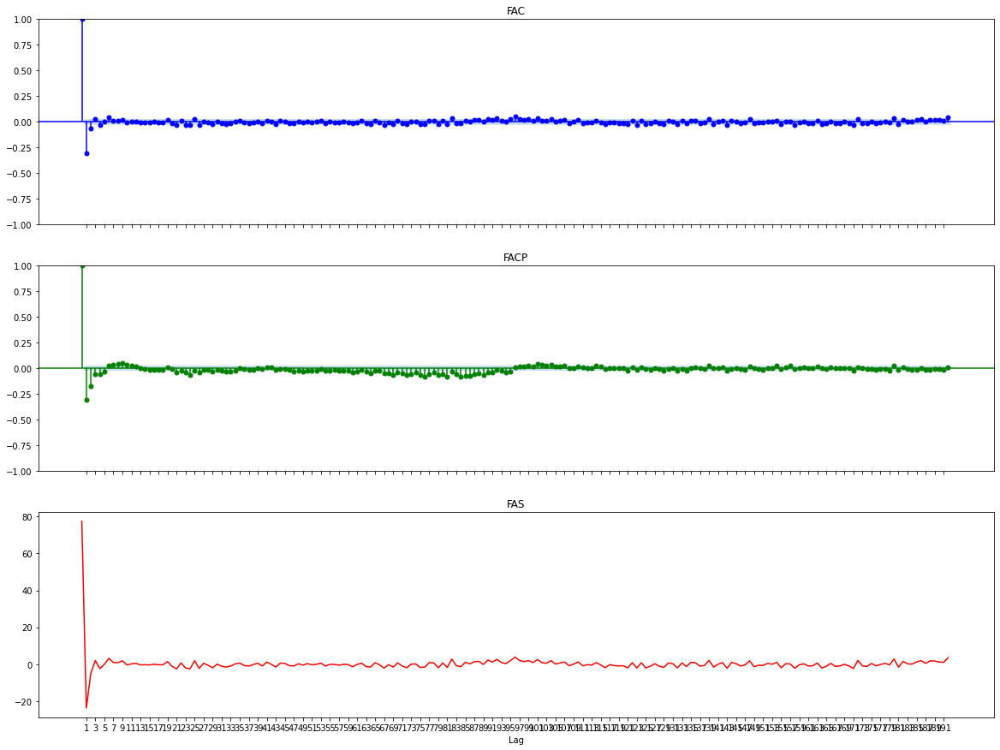

In [ ]:
grafica_FACx(df['boxcox_Trafico_diff1'].dropna())

#### Usuarios activos (sin el lag0)

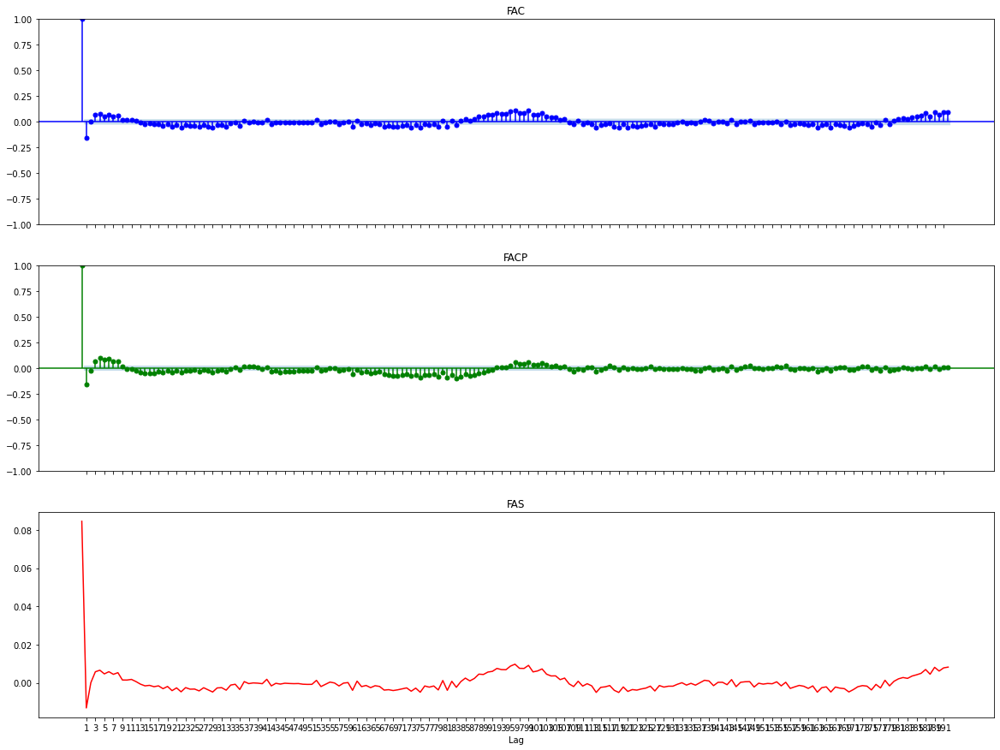

In [ ]:
grafica_FACx(df['boxcox_Usuario_diff1'].dropna())

#### Throughput (sin el lag0)

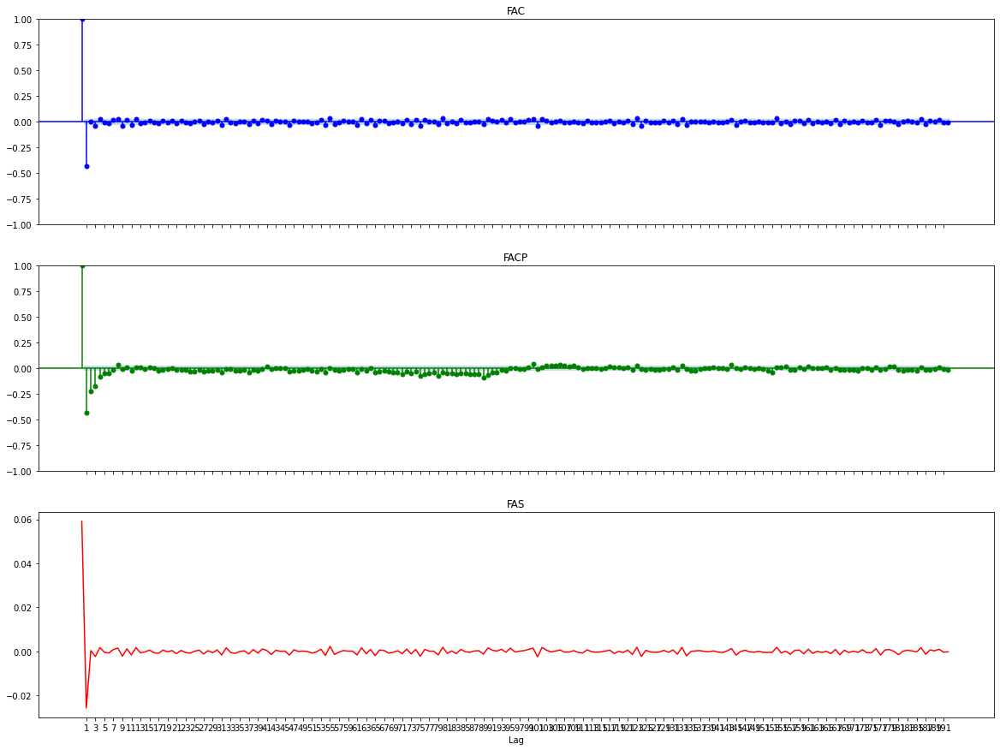

In [ ]:
grafica_FACx(df['boxcox_Throughput_diff1'].dropna())

#4 Estacionalidad
A simple vista vemos que la serie tiene un **período fundamental** de 1 día y un período secundario de 7 días. Se tomará el primero de ellos, con lo cual corresponde a **24x4 muestras** debido a que el tiempo es tomado cada 15 miniutos

In [ ]:
from pmdarima.arima import auto_arima, ndiffs, nsdiffs
# Se testea con nsdiffs, la cantidad de veces que hay que diferenciar para remover la parte estacional de 7 lag

In [ ]:
nsdiffs(df['boxcox_Trafico_diff1'].dropna(), m=24*4) 

0

In [ ]:
nsdiffs(df['boxcox_Usuario_diff1'].dropna(), m=24*4) 

0

In [ ]:
nsdiffs(df['boxcox_Throughput_diff1'].dropna(), m=24*4) 

0

No es necesario diferenciarlo estacionalmente, de hehco si se grafican nuevamente las series diferenciadas se obtiene lo siguiente

In [ ]:
fig = make_subplots(rows=3, cols=1)

fig.add_trace(go.Scatter(x=df.index,y=df['boxcox_Trafico_diff1'], mode='lines',name='DL_Traffic'),row=1, col=1)
fig.add_trace(go.Scatter(x=df.index,y=df['boxcox_Usuario_diff1'], mode='lines',name='User_Active_DL_Avg'),row=2, col=1)
fig.add_trace(go.Scatter(x=df.index,y=df['boxcox_Throughput_diff1'], mode='lines',name='Throughput_User_Dl'),row=3, col=1)

fig.update_layout(height=800, width=1200, title_text="Relaciones",legend=dict(orientation="h",yanchor="bottom", y=1.02,xanchor="right",x=1))

fig.update_xaxes(title_text="Trafico diferenciado", row=1, col=1)
fig.update_xaxes(title_text="Usuarios diferenciado", row=2, col=1)
fig.update_xaxes(title_text="Throughput diferenciado", row=3, col=1)

fig.update_yaxes(title_text="[MBytes]", row=1, col=1)
fig.update_yaxes(title_text="[usuarios]", row=2, col=1)
fig.update_yaxes(title_text="[Kbps]", row=3, col=1)
fig.show()

# 5 Separación Train-Test

Ya realizado el preprocesamiento de las series se realiza la separación train test a fin de entrenar los modelos y probarlos con un set de datos que nunca vió. La longitud del set de Test será un día completo.

In [ ]:
df['split']='train'
df['split'].iloc[len(df)-24*4:]='test'

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
fig = go.Figure()

fig.add_trace(
    go.Scatter(x=df[df['split']=='train'].index, y=df[df['split']=='train']['Throughput_User_Dl'],
                    mode='lines',line=dict(color="#1E2FF6", width=3),
                    name='Train')
)

fig.add_trace(
    go.Scatter(x=df[df['split']=='test'].index, y=df[df['split']=='test']['Throughput_User_Dl'],
                    mode='lines', line=dict(color="#FF0000", width=3), # dash='dot'
                    name='Test')
)

fig.update_layout(height=500, width=1000, title_text="Train - Test split",
                  legend=dict(orientation="h", yanchor="bottom",y=1.02,xanchor="right",x=1))
fig.show()

# 6 Modelo VAR

## 6.1 Criterio de Granger
La hipotesis nula Ho es que X no causa Y, por lo tanto se busca valores menores a 0.05 a fin de tener cierta causalidad entre las variables

In [ ]:
from statsmodels.tsa.stattools import grangercausalitytests

In [ ]:
def grangers_causation_matrix(data, variables, maxlag, testgr='ssr_chi2test', verbose=False):    

    
    df = pd.DataFrame(np.zeros((len(variables), len(variables))), columns=variables, index=variables)
    for c in df.columns:
        for r in df.index:
            test_result = grangercausalitytests(data[[r, c]], maxlag=maxlag, verbose=False)
            p_values = [(test_result[i+1][0][testgr][1],4) for i in range(maxlag)]
            if verbose: print(f'Y = {r}, X = {c}, P Values = {p_values}')
            min_p_value = np.min(p_values)
            df.loc[r, c] = min_p_value
    df.columns = [var + '_x' for var in variables]
    df.index = [var + '_y' for var in variables]
    return df

In [ ]:
testgr = 'ssr_chi2test'

train=df[df['split']=='train'][['boxcox_Trafico_diff1','boxcox_Usuario_diff1','boxcox_Throughput_diff1']].dropna()
grangers_causation_matrix(train, variables = train.columns, maxlag=1) 

,boxcox_Trafico_diff1_x,boxcox_Usuario_diff1_x,boxcox_Throughput_diff1_x
boxcox_Trafico_diff1_y,1.000,0.000,0.000
boxcox_Usuario_diff1_y,0.016,1.000,0.570
boxcox_Throughput_diff1_y,0.578,0.000,1.000


De este test vemos que:
* El tráfico es causa de los usuarios y los usuarios causan el tráfico
* Los usuarios causan el throughput pero el throughput no causa a los usuarios
* El throughput causa al tráfico pero el tráfico no causa al throughput

En resumen hay Cointegracion y tiene sentido plantear un modelo VAR

## 6.2 Entrenamiento

In [ ]:
from statsmodels.tsa.api import VAR

In [ ]:
model = VAR(train)

x = model.select_order(maxlags=100) # De las FACP tenemos una idea que mas o menos eran cerca de los 3lags
print("Minimo AIC: {0}   Minimo BIC: {1}   Minimo FPE: {2} Minimo HQIC: {3}".format(x.aic,x.bic,x.fpe,x.hqic))
# x.summary()

Minimo AIC: 90   Minimo BIC: 8   Minimo FPE: 90 Minimo HQIC: 20


Si miramos el **AIC** vemos que el mejor es el lag90

In [ ]:
model_fitted = model.fit(90)
model_fitted.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Fri, 23, Sep, 2022
Time:                     03:41:03
--------------------------------------------------------------------
No. of Equations:         3.00000    BIC:                   -1.49520
Nobs:                     5717.00    HQIC:                  -2.11179
Log likelihood:          -16545.5    FPE:                  0.0870878
AIC:                     -2.44105    Det(Omega_mle):       0.0757908
--------------------------------------------------------------------
Results for equation boxcox_Trafico_diff1
                                 coefficient       std. error           t-stat            prob
----------------------------------------------------------------------------------------------
const                              -0.013087         0.099175           -0.132           0.895
L1.boxcox_Trafico_diff1            -0.603041         0.018381          -32.809      

**IMPORTANTE:** Vemos que los residuos quedan correlacionados entre ellos lo cual es el efecto esperado dado a que son variables que estan interactuando entre ellas.

Por otro lado vemos que los p-values son muy chicos para muchas de las variables esto sigunifica que rechazan la Ho="el coeficiente es cero". En otras palabras los lags son mayoritariamente significativos.

##6.3 Análisis de residuos

In [ ]:
import scipy.stats
import pylab

#### Correlacion

Como se menciono anteriormente existe correlación entre ellos. 

In [ ]:
model_fitted.resid.corr()

,boxcox_Trafico_diff1,boxcox_Usuario_diff1,boxcox_Throughput_diff1
boxcox_Trafico_diff1,1.000,0.591,0.222
boxcox_Usuario_diff1,0.591,1.000,-0.171
boxcox_Throughput_diff1,0.222,-0.171,1.000


Aca se tiene en cuenta que esten alineados en el tiempo. Cualquier desfasaje de alguno de ellos la correlacion con los demas no debería ser significativa. Para esto podemos desfasar a una serie un lag y a la otra dos lags de maneras que los residuos nos queden desalidenados y calcular la matriz de correlación nuevamente

In [ ]:
df_residuos=model_fitted.resid.copy()

df_residuos['diff_day_DL_Traffic_shift_1']=model_fitted.resid['boxcox_Trafico_diff1'].shift(1)
df_residuos['diff_day_Throughput_User_Dlc_shift_2']=model_fitted.resid['boxcox_Throughput_diff1'].shift(2)
df_residuos.drop(columns=['boxcox_Trafico_diff1','boxcox_Throughput_diff1'],inplace=True)

df_residuos.corr()

,boxcox_Usuario_diff1,diff_day_DL_Traffic_shift_1,diff_day_Throughput_User_Dlc_shift_2
boxcox_Usuario_diff1,1.000,0.001,0.002
diff_day_DL_Traffic_shift_1,0.001,1.000,0.000
diff_day_Throughput_User_Dlc_shift_2,0.002,0.000,1.000


Como se puede observar el valor de las correlaciones cruzadas ahora es practicamente cero 

#### Normalidad

Text(0.5, 1.0, 'QQ Plot | Residuos Throughput')

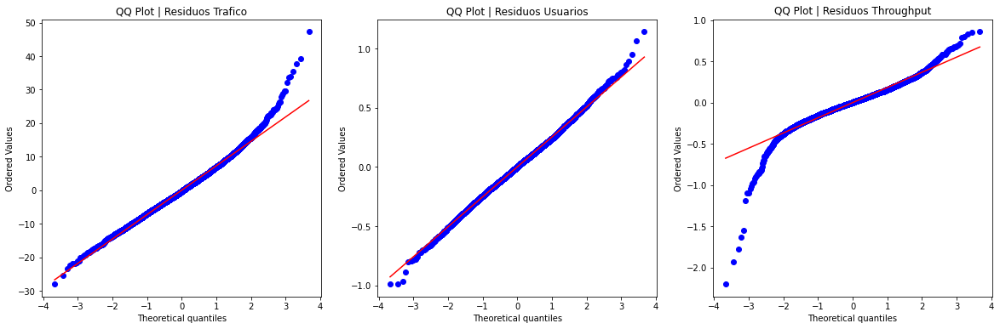

In [ ]:
plt.figure(figsize=(20,6))
plt.subplot(1,3,1)
scipy.stats.probplot(model_fitted.resid['boxcox_Trafico_diff1'], plot = plt)
plt.title("QQ Plot | Residuos Trafico", size = 12)

plt.subplot(1,3,2)
scipy.stats.probplot(model_fitted.resid['boxcox_Usuario_diff1'], plot = plt)
plt.title("QQ Plot | Residuos Usuarios", size = 12)

plt.subplot(1,3,3)
scipy.stats.probplot(model_fitted.resid['boxcox_Throughput_diff1'], plot = plt)
plt.title("QQ Plot | Residuos Throughput", size = 12)

#### Autocorrelacion

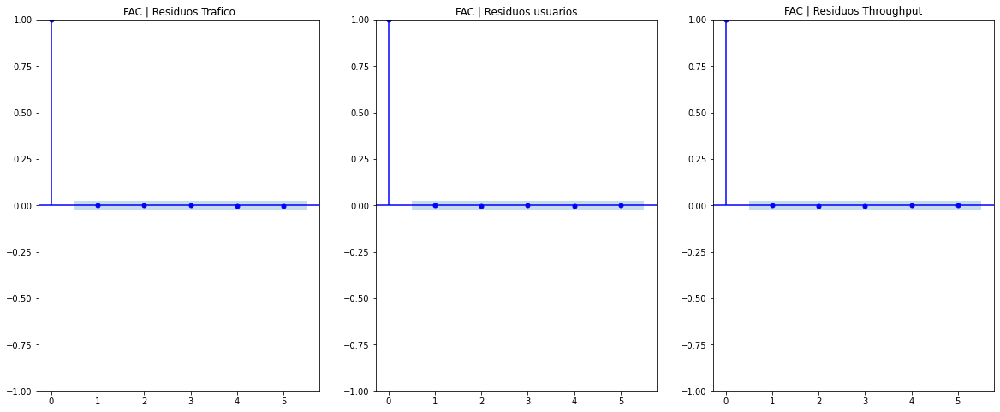

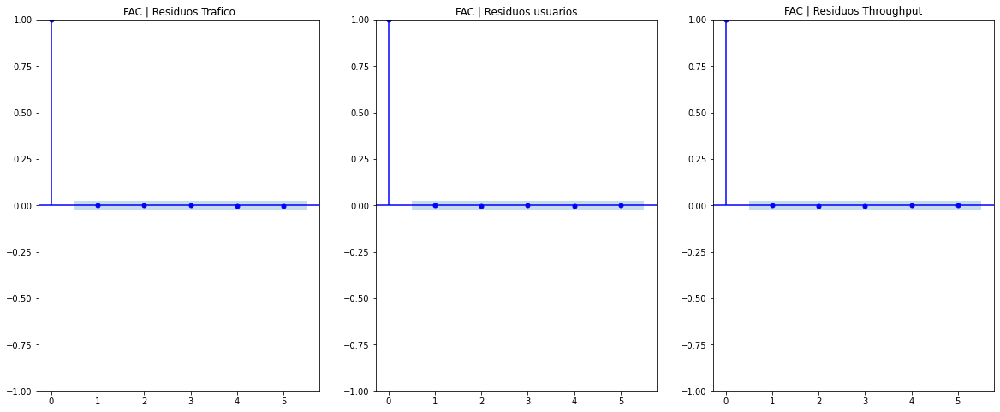

In [ ]:
p1, axes=plt.subplots(1,3,figsize=(20,8),sharex=True, sharey=False )
# axes[2].set_xlabel('Lag')
plot_acf(model_fitted.resid['boxcox_Trafico_diff1'], lags=5, ax= axes[0], color='blue', label="ACF", vlines_kwargs={"colors":'blue'}, title='FAC | Residuos Trafico')
plot_acf(model_fitted.resid['boxcox_Usuario_diff1'], lags=5, ax= axes[1], color='blue', label="ACF", vlines_kwargs={"colors":'blue'}, title='FAC | Residuos usuarios')
plot_acf(model_fitted.resid['boxcox_Throughput_diff1'], lags=5, ax= axes[2], color='blue', label="ACF", vlines_kwargs={"colors":'blue'}, title='FAC | Residuos Throughput')

Acá se observa que los residuos no estan correlacionados con ellos mismos para cualquier lag.

#### Test

In [ ]:
from scipy.stats import jarque_bera, shapiro, boxcox, probplot

In [ ]:
def test_residuos(residuos):


    jarquebera = jarque_bera(residuos)
    print('Jarque-Bera')
    print(f'p-valor: {jarquebera[1]}\n')
    

    shapir = shapiro(residuos)
    print('Shapiro')
    print(f'p-valor: {shapir[1]}\n')

In [ ]:
test_residuos(model_fitted.resid['boxcox_Trafico_diff1'])

Jarque-Bera
p-valor: 0.0

Shapiro
p-valor: 4.440670650876912e-20



/usr/local/lib/python3.7/dist-packages/scipy/stats/morestats.py:1760: UserWarning:

p-value may not be accurate for N > 5000.



In [ ]:
test_residuos(model_fitted.resid['boxcox_Usuario_diff1'])

Jarque-Bera
p-valor: 8.34190216902897e-08

Shapiro
p-valor: 4.310187796363607e-05



In [ ]:
test_residuos(model_fitted.resid['boxcox_Throughput_diff1'])

Jarque-Bera
p-valor: 0.0

Shapiro
p-valor: 1.401298464324817e-45



**Nota:** Los residuos no son normales para ninguna de las series debido a que se rechaza la Ho de Shapiro

#### Grafica de los residuos

In [ ]:
fig = make_subplots(rows=3, cols=1)

fig.add_trace(go.Scatter(x=df.index,y=model_fitted.resid['boxcox_Trafico_diff1'], mode='lines',name='Residuos Trafico'),row=1, col=1)
fig.add_trace(go.Scatter(x=df.index,y=model_fitted.resid['boxcox_Usuario_diff1'], mode='lines',name='Residuos Usuarios'),row=2, col=1)
fig.add_trace(go.Scatter(x=df.index,y=model_fitted.resid['boxcox_Throughput_diff1'], mode='lines',name='Residuos Throughput'),row=3, col=1)

fig.update_layout(height=800, width=1200, title_text="Relaciones",legend=dict(orientation="h",yanchor="bottom", y=1.02,xanchor="right",x=1))
fig.show()

Finalmente vemos que los residuos se mueven cerca del cero

In [ ]:
model_fitted.resid.mean()

boxcox_Trafico_diff1      -0.000
boxcox_Usuario_diff1       0.000
boxcox_Throughput_diff1   -0.000
dtype: float64

## 6.4 Predicción

In [ ]:
futuro = 24*4
lag_orden = 90

pred = model_fitted.forecast_interval(train.values[-lag_orden:], steps=futuro)

In [ ]:
pred_mean=pd.DataFrame(pred[0],columns=['pred_mean_diff_Traffic','pred_mean_diff_User','pred_mean_diff_Thp'])
pred_lower=pd.DataFrame(pred[1],columns=['pred_lower_diff_Traffic','pred_lower_diff_User','pred_lower_diff_Thp'])
pred_up=pd.DataFrame(pred[2],columns=['pred_up_diff_Traffic','pred_up_diff_User','pred_up_diff_Thp'])

# Genero dataset de prediccion
df_pred=pd.concat([pred_lower,pred_mean,pred_up],axis=1)

# Le seteo el index para que le quede las fechas del test
df_pred.set_index(df[df['split']=='test'].index,inplace=True)

#Incorporo las predicciones como columnas del dataset original
df=pd.concat([df,df_pred],axis=1)

In [ ]:
# # Le seteo el index para que le quede las fechas del test
# df_pred.set_index(df[df['split']=='test'].index,inplace=True)

# # Agrego las columnas de Test
# df_pred[['test_diff_Traffic','test_diff_User','test_diff_Thp']]=df[df['split']=='test'][['diff_day_DL_Traffic','diff_day_User_Active_DL_Avg','diff_day_Throughput_User_Dl']].copy()

In [ ]:
fig = go.Figure()

train_limitado=df[df['split']=='train'].iloc[-10*24*4:]

fig.add_trace(go.Scatter(x=train_limitado.index, y=train_limitado['boxcox_Trafico_diff1'],mode='lines',line=dict(color="#1E2FF6", width=3),name='Train'))
fig.add_trace(go.Scatter(x=df[df['split']=='test'].index, y=df[df['split']=='test']['boxcox_Trafico_diff1'],mode='lines', line=dict(color="#FF0000", width=3),name='Test'))

fig.add_trace(go.Scatter(x=df[df['split']=='test'].index, y=df.loc[df[df['split']=='test'].index,'pred_mean_diff_Traffic'],
                         mode='lines',line=dict(color='rgba(0, 0, 0,1)', width=3),name='Prediction'))
fig.add_traces([go.Scatter(x = df[df['split']=='test'].index, y = df.loc[df[df['split']=='test'].index,'pred_lower_diff_Traffic'],
                                  mode = 'lines', line=dict(color='rgba(0,0,0,0.5)', width=1),showlegend = False),
                        go.Scatter(x = df[df['split']=='test'].index, y = df.loc[df[df['split']=='test'].index,'pred_up_diff_Traffic'],
                                  mode = 'lines', line=dict(color='rgba(0,0,0,0.5)', width=1),
                                  name = '95% confidence interval',fill='tonexty', fillcolor = 'rgba(0, 0, 0, 0.2)')])

fig.update_layout(height=500, width=1000, title_text="Predicción Trafico",legend=dict(orientation="h", yanchor="bottom",y=1.02,xanchor="right",x=1))
fig.show()

Antes de continuar se realizará la antitrnasformaciones anteriores

## 6.5 Integracion estacional

In [ ]:
df.columns

Index(['DL_Traffic', 'User_Active_DL_Avg', 'Throughput_User_Dl',
       'boxcox_DL_Traffic', 'boxcox_User_Active_DL_Avg',
       'boxcox_Throughput_User_Dl', 'boxcox_Trafico_diff1',
       'boxcox_Usuario_diff1', 'boxcox_Throughput_diff1', 'split',
       'pred_lower_diff_Traffic', 'pred_lower_diff_User',
       'pred_lower_diff_Thp', 'pred_mean_diff_Traffic', 'pred_mean_diff_User',
       'pred_mean_diff_Thp', 'pred_up_diff_Traffic', 'pred_up_diff_User',
       'pred_up_diff_Thp'],
      dtype='object')

El valor de **df[df['split']=='train'].tail(1)['boxcox_DL_Traffic'][0]** corresponde a la condiciones iniciales que se pierden cuando se realiza una diferenciacion.

In [ ]:
# df['reverse_diff_DL_Traffic_pred'] = df['boxcox_Throughput_User_Dl'].shift(24*4) + df['pred_up_diff_Thp']



# VERIICAR
delta_trafic_a0=df[df['split']=='test'].head(1)['pred_up_diff_Traffic'][0]-df[df['split']=='test'].head(1)['pred_lower_diff_Traffic'][0]

df['pred_lower_boxcox_Trafico'] = df[df['split']=='test']['pred_lower_diff_Traffic'].cumsum()+df[df['split']=='train'].tail(1)['boxcox_DL_Traffic'][0]
df['pred_mean_boxcox_Trafico'] = df[df['split']=='test']['pred_mean_diff_Traffic'].cumsum()+df[df['split']=='train'].tail(1)['boxcox_DL_Traffic'][0]
df['pred_up_boxcox_Trafico'] = df[df['split']=='test']['pred_up_diff_Traffic'].cumsum()+df[df['split']=='train'].tail(1)['boxcox_DL_Traffic'][0]

df['pred_lower_boxcox_Usuario'] = df[df['split']=='test']['pred_lower_diff_User'].cumsum()+df[df['split']=='train'].tail(1)['boxcox_User_Active_DL_Avg'][0]
df['pred_mean_boxcox_Usuario'] = df[df['split']=='test']['pred_mean_diff_User'].cumsum()+df[df['split']=='train'].tail(1)['boxcox_User_Active_DL_Avg'][0]
df['pred_up_boxcox_Usuario'] = df[df['split']=='test']['pred_up_diff_User'].cumsum()+df[df['split']=='train'].tail(1)['boxcox_User_Active_DL_Avg'][0]

df['pred_lower_boxcox_Thrp'] = df[df['split']=='test']['pred_lower_diff_Thp'].cumsum()+df[df['split']=='train'].tail(1)['boxcox_Throughput_User_Dl'][0]
df['pred_mean_boxcox_Thrp'] = df[df['split']=='test']['pred_mean_diff_Thp'].cumsum()+df[df['split']=='train'].tail(1)['boxcox_Throughput_User_Dl'][0]
df['pred_up_boxcox_Thrp'] = df[df['split']=='test']['pred_up_diff_Thp'].cumsum()+df[df['split']=='train'].tail(1)['boxcox_Throughput_User_Dl'][0]



##6.6 Antitransformación Box Cox

In [ ]:
from scipy.special import inv_boxcox

In [ ]:
df['pred_lower_Trafico'] = inv_boxcox(df['pred_lower_boxcox_Trafico'], lam_traffic) 
df['pred_mean_Trafico'] = inv_boxcox(df['pred_mean_boxcox_Trafico'], lam_traffic) 
df['pred_up_Trafico'] = inv_boxcox(df['pred_up_boxcox_Trafico'], lam_traffic) 

df['pred_lower_Usuario'] = inv_boxcox(df['pred_lower_boxcox_Usuario'], lam_user) 
df['pred_mean_Usuario'] = inv_boxcox(df['pred_mean_boxcox_Usuario'], lam_user) 
df['pred_up_Usuario'] = inv_boxcox(df['pred_up_boxcox_Usuario'], lam_user) 

df['pred_lower_Thrp'] = inv_boxcox(df['pred_lower_boxcox_Thrp'], lam_thp) 
df['pred_mean_Thrp'] = inv_boxcox(df['pred_mean_boxcox_Thrp'], lam_thp) 
df['pred_up_Thrp'] = inv_boxcox(df['pred_up_boxcox_Thrp'], lam_thp) 

## 6.7 Gráficos de la predicción

#### Tráfico

In [ ]:
fig = go.Figure()

train_limitado=df[df['split']=='train'].iloc[-10*24*4:]

fig.add_trace(go.Scatter(x=train_limitado.index, y=train_limitado['DL_Traffic'],mode='lines',line=dict(color="#1E2FF6", width=3),name='Train'))
fig.add_trace(go.Scatter(x=df[df['split']=='test'].index, y=df[df['split']=='test']['DL_Traffic'],mode='lines', line=dict(color="#FF0000", width=3),name='Test'))

fig.add_trace(go.Scatter(x=df[df['split']=='test'].index, y=df.loc[df[df['split']=='test'].index,'pred_mean_Trafico'],
                         mode='lines',line=dict(color='rgba(0, 0, 0,1)', width=3),name='Prediction'))

# fig.add_trace(go.Scatter(x=df[df['split']=='test'].index, y=df.loc[df[df['split']=='test'].index,'pred_lower_Trafico'],
#                          mode='lines',line=dict(color='rgba(0, 0, 0,1)', width=1),name='low'))
# fig.add_trace(go.Scatter(x=df[df['split']=='test'].index, y=df.loc[df[df['split']=='test'].index,'pred_up_Trafico'],
#                          mode='lines',line=dict(color='rgba(0, 0, 0,1)', width=1),name='up'))

fig.update_yaxes(title_text="[MBytes]")

fig.update_layout(height=500, width=1000, title_text="Predicción Trafico",legend=dict(orientation="h", yanchor="bottom",y=1.02,xanchor="right",x=1))
fig.show()

#### Usuarios

In [ ]:
fig = go.Figure()

train_limitado=df[df['split']=='train'].iloc[-10*24*4:]

fig.add_trace(go.Scatter(x=train_limitado.index, y=train_limitado['User_Active_DL_Avg'],mode='lines',line=dict(color="#1E2FF6", width=3),name='Train'))
fig.add_trace(go.Scatter(x=df[df['split']=='test'].index, y=df[df['split']=='test']['User_Active_DL_Avg'],mode='lines', line=dict(color="#FF0000", width=3),name='Test'))

fig.add_trace(go.Scatter(x=df[df['split']=='test'].index, y=df.loc[df[df['split']=='test'].index,'pred_mean_Usuario'],
                         mode='lines',line=dict(color='rgba(0, 0, 0,1)', width=3),name='Prediction'))

# fig.add_trace(go.Scatter(x=df[df['split']=='test'].index, y=df.loc[df[df['split']=='test'].index,'pred_lower_Usuario'],
#                          mode='lines',line=dict(color='rgba(0, 0, 0,1)', width=1),name='low'))
# fig.add_trace(go.Scatter(x=df[df['split']=='test'].index, y=df.loc[df[df['split']=='test'].index,'pred_up_Usuario'],
#                          mode='lines',line=dict(color='rgba(0, 0, 0,1)', width=1),name='up'))


fig.update_yaxes(title_text="[usuarios]")

fig.update_layout(height=500, width=1000, title_text="Predicción Usuarios",legend=dict(orientation="h", yanchor="bottom",y=1.02,xanchor="right",x=1))
fig.show()

#### Throuhput

In [ ]:
fig = go.Figure()

train_limitado=df[df['split']=='train'].iloc[-10*24*4:]

fig.add_trace(go.Scatter(x=train_limitado.index, y=train_limitado['Throughput_User_Dl'],mode='lines',line=dict(color="#1E2FF6", width=3),name='Train'))
fig.add_trace(go.Scatter(x=df[df['split']=='test'].index, y=df[df['split']=='test']['Throughput_User_Dl'],mode='lines', line=dict(color="#FF0000", width=3),name='Test'))

fig.add_trace(go.Scatter(x=df[df['split']=='test'].index, y=df.loc[df[df['split']=='test'].index,'pred_mean_Thrp'],
                         mode='lines',line=dict(color='rgba(0, 0, 0,1)', width=3),name='Prediction'))

# fig.add_trace(go.Scatter(x=df[df['split']=='test'].index, y=df.loc[df[df['split']=='test'].index,'pred_lower_Thrp'],
#                          mode='lines',line=dict(color='rgba(0, 0, 0,1)', width=1),name='low'))
# fig.add_trace(go.Scatter(x=df[df['split']=='test'].index, y=df.loc[df[df['split']=='test'].index,'pred_up_Thrp'],
#                          mode='lines',line=dict(color='rgba(0, 0, 0,1)', width=1),name='up'))


fig.update_yaxes(title_text="[Kbps]")

fig.update_layout(height=500, width=1000, title_text="Predicción Throughput",legend=dict(orientation="h", yanchor="bottom",y=1.02,xanchor="right",x=1))
fig.show()

**CONCLUSION** Si bien se ve un buen ajuste

## 6.8 Evaluacion con métricas

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

In [ ]:
def evaluar_metricas(serie_test, serie_pred):
    print(f'MSE: {mean_squared_error(serie_test, serie_pred)}')
    print(f'MAE: {mean_absolute_error(serie_test, serie_pred)}')
    print(f'RMSE: {np.sqrt(mean_squared_error(serie_test, serie_pred))}')
    print(f'MAPE: {round(np.mean(abs((serie_test-serie_pred)/serie_test)),4)}')

#### Trafico

In [ ]:
evaluar_metricas(df[df['split']=='test']['DL_Traffic'],df[df['split']=='test']['pred_mean_Trafico'])

MSE: 94952.1800339442
MAE: 239.13779544752649
RMSE: 308.14311615537383
MAPE: 0.7973


#### Usuario

In [ ]:
evaluar_metricas(df[df['split']=='test']['User_Active_DL_Avg'],df[df['split']=='test']['pred_mean_Usuario'])

MSE: 1.1081468386537399
MAE: 0.7801508497781128
RMSE: 1.05268553645129
MAPE: 0.9307


#### Throughput

In [ ]:
evaluar_metricas(df[df['split']=='test']['Throughput_User_Dl'],df[df['split']=='test']['pred_mean_Thrp'])

MSE: 16.87021284927422
MAE: 2.8871206232852065
RMSE: 4.107336466528427
MAPE: 0.1964


## 6.9 Impulso respuesta

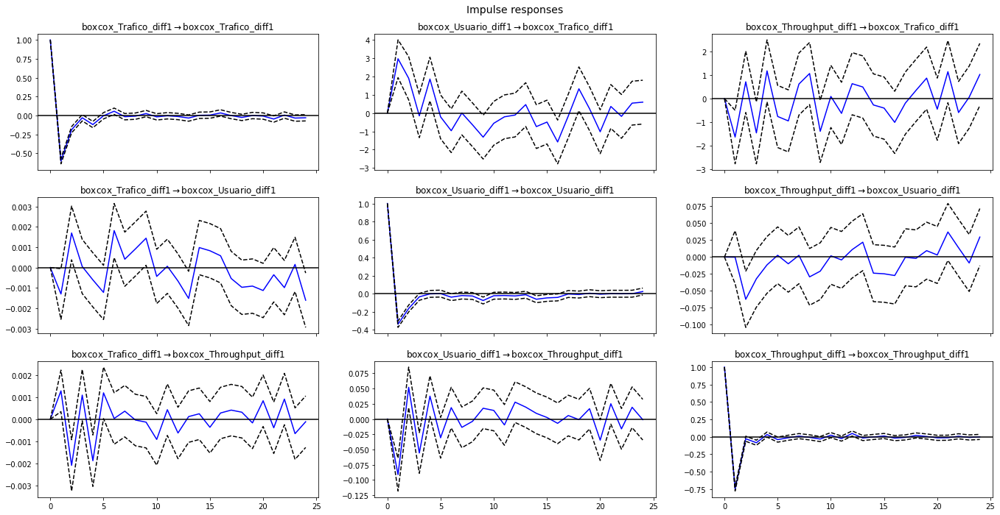

In [ ]:
# plt.figure(figsize=(12,3), dpi=100)
model_fitted.irf(24).plot(figsize=(20,10));

#7 Modelo Prophet

Se eligió este modelo debido a que unas de las ventajas es que maneja la multiestacionalidad. La parte negativa es que Prophet no maneja multiples variables

In [ ]:
!pip install pystan
!pip install pystan==2.19.1.1
!pip install prophet
!pip install fbprophet

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 80 kB 3.3 MB/s 
  Attempting uninstall: cmdstanpy
    Found existing installation: cmdstanpy 0.9.5
    Uninstalling cmdstanpy-0.9.5:
      Successfully uninstalled cmdstanpy-0.9.5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
fbprophet 0.7.1 requires cmdstanpy==0.9.5, but you have cmdstanpy 1.0.7 which is incompatible.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached cmdstanpy-0.9.5-py3-none-any.whl (37 kB)
  Attempting uninstall: cmdstanpy
    Found existing insta

In [ ]:
import pandas as pd
from fbprophet import Prophet
# from prophet import Prophet

##7.1 Carga del dataset

In [ ]:
path_file='/content/drive/MyDrive/maestria/materias/Series temporales/TP_2/dataset.csv'

df = pd.read_csv(path_file,sep=';') 
df.rename(columns = {'PERIOD_START_TIME':'timepo_15min'}, inplace = True)
df.drop(columns=['LNCEL_NAME'],inplace=True)
#Convierto el tiempo en el tipo de variable datetime
df['timepo_15min'] = pd.to_datetime(df['timepo_15min'], dayfirst = True) 
print(df.dtypes)
# Lo pongo como indice
df.set_index("timepo_15min", inplace=True)
# Geenra un eje temporal sin huecos
df=df.asfreq(freq='15min',method='ffill')

timepo_15min          datetime64[ns]
DL_Traffic                   float64
User_Active_DL_Avg           float64
Throughput_User_Dl           float64
dtype: object


In [ ]:
# Generamos un dataset para cada una de las series y le damos el formato correspondiente

dfp_traffic = df[['DL_Traffic']].reset_index(drop=False).set_axis(['ds','y'], axis=1, inplace=False) 
dfp_user = df[['User_Active_DL_Avg']].reset_index(drop=False).set_axis(['ds','y'], axis=1, inplace=False)  
dfp_thrp = df[['Throughput_User_Dl']].reset_index(drop=False).set_axis(['ds','y'], axis=1, inplace=False)  

In [ ]:
dfp_traffic.head()

,ds,y
0,2022-07-19 00:00:00,215.099
1,2022-07-19 00:15:00,366.456
2,2022-07-19 00:30:00,464.536
3,2022-07-19 00:45:00,217.799
4,2022-07-19 01:00:00,177.378


## 7.2 Separación train-test

Se realiza la misma separación de un día, hay que recordar que los datos se tienen cada 15 minutos por lo tanto serían 24x4 muestras

In [ ]:
dfp_traffic_train=dfp_traffic[:-24*4]
dfp_traffic_test=dfp_traffic[-24*4:]

dfp_user_train=dfp_user[:-24*4]
dfp_user_test=dfp_user[-24*4:]

dfp_thrp_train=dfp_thrp[:-24*4]
dfp_thrp_test=dfp_thrp[-24*4:]

## 7.3 Entrenamiento

#### Trafico

In [ ]:
# Trafico
mt = Prophet(interval_width=0.95, daily_seasonality=True,weekly_seasonality=True,yearly_seasonality=False)
mt.fit(dfp_traffic_train)

In [ ]:
#usuario
mu = Prophet(interval_width=0.95, daily_seasonality=True,weekly_seasonality=True,yearly_seasonality=False)
mu.fit(dfp_user_train)

In [ ]:
#throughput
mthp = Prophet(interval_width=0.95, daily_seasonality=True,weekly_seasonality=True,yearly_seasonality=False)
mthp.fit(dfp_thrp_train)

## 7.4 Predicciones

In [ ]:
future = mt.make_future_dataframe(periods=24*4,freq='15min')

#### Tráfico

In [ ]:
pred_trafico = mt.predict(future)

In [ ]:
fig = go.Figure()

train_limitado=dfp_traffic_train.iloc[-10*24*4:]

fig.add_trace(go.Scatter(x=train_limitado['ds'], y=train_limitado['y'],mode='lines',line=dict(color="#1E2FF6", width=3),name='Train'))
fig.add_trace(go.Scatter(x=dfp_traffic_test['ds'], y=dfp_traffic_test['y'],mode='lines', line=dict(color="#FF0000", width=3),name='Test'))

fig.add_trace(go.Scatter(x=pred_trafico['ds'].tail(24*4), y=pred_trafico['yhat'].tail(24*4),
                         mode='lines',line=dict(color='rgba(0, 0, 0,1)', width=3),name='Prediction'))

fig.add_trace(go.Scatter(x=pred_trafico['ds'].tail(24*4),y=pred_trafico['yhat_upper'].tail(24*4),
                         mode='lines',line=dict(color='rgba(0, 0, 0,1)', width=1),name='low'))
fig.add_trace(go.Scatter(x=pred_trafico['ds'].tail(24*4), y=pred_trafico['yhat_lower'].tail(24*4),
                         mode='lines',line=dict(color='rgba(0, 0, 0,1)', width=1),name='up'))

fig.update_yaxes(title_text="[MBytes]")
fig.update_layout(height=500, width=1000, title_text="Predicción Trafico",legend=dict(orientation="h", yanchor="bottom",y=1.02,xanchor="right",x=1))
fig.show()

#### Usuarios

In [ ]:
pred_usuario= mu.predict(future)

In [ ]:
fig = go.Figure()

train_limitado=dfp_user_train.iloc[-10*24*4:]

fig.add_trace(go.Scatter(x=train_limitado['ds'], y=train_limitado['y'],mode='lines',line=dict(color="#1E2FF6", width=3),name='Train'))
fig.add_trace(go.Scatter(x=dfp_user_test['ds'], y=dfp_user_test['y'],mode='lines', line=dict(color="#FF0000", width=3),name='Test'))

fig.add_trace(go.Scatter(x=pred_usuario['ds'].tail(24*4), y=pred_usuario['yhat'].tail(24*4),
                         mode='lines',line=dict(color='rgba(0, 0, 0,1)', width=3),name='Prediction'))

fig.add_trace(go.Scatter(x=pred_usuario['ds'].tail(24*4),y=pred_usuario['yhat_upper'].tail(24*4),
                         mode='lines',line=dict(color='rgba(0, 0, 0,1)', width=1),name='low'))
fig.add_trace(go.Scatter(x=pred_usuario['ds'].tail(24*4), y=pred_usuario['yhat_lower'].tail(24*4),
                         mode='lines',line=dict(color='rgba(0, 0, 0,1)', width=1),name='up'))

fig.update_yaxes(title_text="[Usuarios]")
fig.update_layout(height=500, width=1000, title_text="Predicción Usuario",legend=dict(orientation="h", yanchor="bottom",y=1.02,xanchor="right",x=1))
fig.show()

#### Througput

In [ ]:
pred_throughout= mthp.predict(future)

In [ ]:
fig = go.Figure()

train_limitado=dfp_thrp_train.iloc[-10*24*4:]

fig.add_trace(go.Scatter(x=train_limitado['ds'], y=train_limitado['y'],mode='lines',line=dict(color="#1E2FF6", width=3),name='Train'))
fig.add_trace(go.Scatter(x=dfp_thrp_test['ds'], y=dfp_thrp_test['y'],mode='lines', line=dict(color="#FF0000", width=3),name='Test'))

fig.add_trace(go.Scatter(x=pred_throughout['ds'].tail(24*4), y=pred_throughout['yhat'].tail(24*4),
                         mode='lines',line=dict(color='rgba(0, 0, 0,1)', width=3),name='Prediction'))

fig.add_trace(go.Scatter(x=pred_throughout['ds'].tail(24*4),y=pred_throughout['yhat_upper'].tail(24*4),
                         mode='lines',line=dict(color='rgba(0, 0, 0,1)', width=1),name='low'))
fig.add_trace(go.Scatter(x=pred_throughout['ds'].tail(24*4), y=pred_throughout['yhat_lower'].tail(24*4),
                         mode='lines',line=dict(color='rgba(0, 0, 0,1)', width=1),name='up'))

fig.update_yaxes(title_text="[Kbps]")
fig.update_layout(height=500, width=1000, title_text="Predicción Througput",legend=dict(orientation="h", yanchor="bottom",y=1.02,xanchor="right",x=1))
fig.show()

## 7.5 Evaluación con métricas

#### Trafico

In [ ]:
evaluar_metricas(dfp_traffic_test['y'],pred_trafico['yhat'].tail(24*4))


MSE: 72200.44312509433
MAE: 221.0015654346192
RMSE: 268.7014014200416
MAPE: 0.8125


#### Usuarios

In [ ]:
evaluar_metricas(dfp_user_test['y'],pred_usuario['yhat'].tail(24*4))

MSE: 0.7038420361884358
MAE: 0.6675501852224821
RMSE: 0.8389529403896477
MAPE: 1.1451


#### Throughput

In [ ]:
evaluar_metricas(dfp_thrp_test['y'],pred_throughout['yhat'].tail(24*4))

MSE: 17.003236207294965
MAE: 2.8281999276537313
RMSE: 4.1234980547218605
MAPE: 0.1948


## 7.6 Estacionalidad multiplicativa

### 7.6.1 Entrenamiento

In [ ]:
# Trafico 
mt_m = Prophet(interval_width=0.95, daily_seasonality=True,weekly_seasonality=True,yearly_seasonality=False,seasonality_mode='multiplicative')
mt_m.fit(dfp_traffic_train)

#usuario
mu_m = Prophet(interval_width=0.95, daily_seasonality=True,weekly_seasonality=True,yearly_seasonality=False,seasonality_mode='multiplicative')
mu_m.fit(dfp_user_train)

#throughput
mthp_m  = Prophet(interval_width=0.95, daily_seasonality=True,weekly_seasonality=True,yearly_seasonality=False,seasonality_mode='multiplicative')
mthp_m .fit(dfp_thrp_train)

### 7.6.2 Prediccion

#### Tráfico

In [ ]:
pred_trafico_m = mt_m.predict(future)

In [ ]:
fig = go.Figure()

train_limitado=dfp_traffic_train.iloc[-10*24*4:]

fig.add_trace(go.Scatter(x=train_limitado['ds'], y=train_limitado['y'],mode='lines',line=dict(color="#1E2FF6", width=3),name='Train'))
fig.add_trace(go.Scatter(x=dfp_traffic_test['ds'], y=dfp_traffic_test['y'],mode='lines', line=dict(color="#FF0000", width=3),name='Test'))

fig.add_trace(go.Scatter(x=pred_trafico_m['ds'].tail(24*4), y=pred_trafico_m['yhat'].tail(24*4),
                         mode='lines',line=dict(color='rgba(0, 0, 0,1)', width=3),name='Prediction'))

fig.add_trace(go.Scatter(x=pred_trafico_m['ds'].tail(24*4),y=pred_trafico['yhat_upper'].tail(24*4),
                         mode='lines',line=dict(color='rgba(0, 0, 0,1)', width=1),name='low'))
fig.add_trace(go.Scatter(x=pred_trafico_m['ds'].tail(24*4), y=pred_trafico_m['yhat_lower'].tail(24*4),
                         mode='lines',line=dict(color='rgba(0, 0, 0,1)', width=1),name='up'))


fig.update_layout(height=500, width=1000, title_text="Predicción Trafico",legend=dict(orientation="h", yanchor="bottom",y=1.02,xanchor="right",x=1))
fig.show()

#### Usuarios

In [ ]:
pred_usuario_m= mu_m.predict(future)

In [ ]:
fig = go.Figure()

train_limitado=dfp_user_train.iloc[-10*24*4:]

fig.add_trace(go.Scatter(x=train_limitado['ds'], y=train_limitado['y'],mode='lines',line=dict(color="#1E2FF6", width=3),name='Train'))
fig.add_trace(go.Scatter(x=dfp_user_test['ds'], y=dfp_user_test['y'],mode='lines', line=dict(color="#FF0000", width=3),name='Test'))

fig.add_trace(go.Scatter(x=pred_usuario_m['ds'].tail(24*4), y=pred_usuario_m['yhat'].tail(24*4),
                         mode='lines',line=dict(color='rgba(0, 0, 0,1)', width=3),name='Prediction'))

fig.add_trace(go.Scatter(x=pred_usuario_m['ds'].tail(24*4),y=pred_usuario_m['yhat_upper'].tail(24*4),
                         mode='lines',line=dict(color='rgba(0, 0, 0,1)', width=1),name='low'))
fig.add_trace(go.Scatter(x=pred_usuario_m['ds'].tail(24*4), y=pred_usuario_m['yhat_lower'].tail(24*4),
                         mode='lines',line=dict(color='rgba(0, 0, 0,1)', width=1),name='up'))


fig.update_layout(height=500, width=1000, title_text="Predicción Usuario",legend=dict(orientation="h", yanchor="bottom",y=1.02,xanchor="right",x=1))
fig.show()

#### Throughput

In [ ]:
pred_throughout_m= mthp_m.predict(future)

In [ ]:
fig = go.Figure()

train_limitado=dfp_thrp_train.iloc[-10*24*4:]

fig.add_trace(go.Scatter(x=train_limitado['ds'], y=train_limitado['y'],mode='lines',line=dict(color="#1E2FF6", width=3),name='Train'))
fig.add_trace(go.Scatter(x=dfp_thrp_test['ds'], y=dfp_thrp_test['y'],mode='lines', line=dict(color="#FF0000", width=3),name='Test'))

fig.add_trace(go.Scatter(x=pred_throughout_m['ds'].tail(24*4), y=pred_throughout_m['yhat'].tail(24*4),
                         mode='lines',line=dict(color='rgba(0, 0, 0,1)', width=3),name='Prediction'))

fig.add_trace(go.Scatter(x=pred_throughout_m['ds'].tail(24*4),y=pred_throughout_m['yhat_upper'].tail(24*4),
                         mode='lines',line=dict(color='rgba(0, 0, 0,1)', width=1),name='low'))
fig.add_trace(go.Scatter(x=pred_throughout_m['ds'].tail(24*4), y=pred_throughout_m['yhat_lower'].tail(24*4),
                         mode='lines',line=dict(color='rgba(0, 0, 0,1)', width=1),name='up'))


fig.update_layout(height=500, width=1000, title_text="Predicción Usuario",legend=dict(orientation="h", yanchor="bottom",y=1.02,xanchor="right",x=1))
fig.show()

### 7.6.7 Ecaluacion con metricas

#### Tráfico

In [ ]:
evaluar_metricas(dfp_traffic_test['y'],pred_trafico_m['yhat'].tail(24*4))

MSE: 94885.71523129039
MAE: 263.84837194751486
RMSE: 308.0352499817032
MAPE: 1.0404


#### Usuarios

In [ ]:
evaluar_metricas(dfp_user_test['y'],pred_usuario_m['yhat'].tail(24*4))

MSE: 1.2521413451476302
MAE: 0.9451471285530756
RMSE: 1.118991217636506
MAPE: 1.9445


#### Throughput

In [ ]:
evaluar_metricas(dfp_thrp_test['y'],pred_throughout_m['yhat'].tail(24*4))

MSE: 16.099578917443708
MAE: 2.773374507931365
RMSE: 4.012428057603489
MAPE: 0.1937


# 8 Modelo VAR con análisis espectral (Fourier)

In [ ]:
from numpy.fft import fft, ifft

## 8.1 Carga dataset

In [ ]:
path_file='/content/drive/MyDrive/maestria/materias/Series temporales/TP_2/dataset.csv'

df = pd.read_csv(path_file,sep=';') 
df.rename(columns = {'PERIOD_START_TIME':'timepo_15min'}, inplace = True)
df.drop(columns=['LNCEL_NAME'],inplace=True)
#Convierto el tiempo en el tipo de variable datetime
df['timepo_15min'] = pd.to_datetime(df['timepo_15min'], dayfirst = True) 
print(df.dtypes)
# Lo pongo como indice
df.set_index("timepo_15min", inplace=True)
# Geenra un eje temporal sin huecos
df=df.asfreq(freq='15min',method='ffill')

timepo_15min          datetime64[ns]
DL_Traffic                   float64
User_Active_DL_Avg           float64
Throughput_User_Dl           float64
dtype: object


In [ ]:
df['split']='train'
df['split'].iloc[len(df)-24*4:]='test'

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



## 8.1 Generacion de series sintetizadas

Se definirán dos funciones para la sintetizacion de series periódicas

In [ ]:
def quickStart(df_xn,N_tot,nro_comp_espect=50, fm=24*4):
  #########################################################################################################################
  # Esta funcion genera:                                                                                                  #
  #     - los ejes de frecuencia para la secuencia original y para la ampliada (N_tot)                                    #
  #     - el eje temporal para ambas secuencias                                                                           #
  #     - genera una grafica de componenetes espectrales para ver donde cortar                      
  #  
  # df_xn: serie a trabajar, generalmente son los datos de train
  # N_tot: tamaño final de la serie, generalemnte es train + test
  # nro_comp_espect: son la cantidad de frecuencias a graficar
  # fm: cantidad de muestras en el día                                        #
  #########################################################################################################################    

  #muestras por días
  Tm=1/fm
  # T=1 # periodo de la serie, cada 7 dias
  N=df_xn.shape[0] # Tamaño de la serie original, generalmente de Train

  #---------------------------------------------------------
  # EJES TEMPORALES
  n=np.arange(0,N)
  n_tot=np.arange(0,N_tot)

  # Ejes de frecuencias - train
  k=np.concatenate([np.arange(0,N/2), np.arange(-N/2,0)]) # La funcion fft da las frecuences 0 a fn y -fn a 0 siendo fn la frecuencia de Nyquist
  k=np.concatenate([np.arange(0,N/2), np.arange(-N/2,0)]) # La funcion fft da las frecuences 0 a fn y -fn a 0 siendo fn la frecuencia de Nyquist
  s=k/N*fm 

  # Ejes de frecuencias -pra la salida generalmente train + test
  N_tot=df.shape[0]
  k_tot=np.concatenate([np.arange(0,N_tot/2), np.arange(-N_tot/2,0)]) # La funcion fft da las frecuences 0 a fn y -fn a 0 siendo fn la frecuencia de Nyquist
  k_tot=np.concatenate([np.arange(0,N_tot/2), np.arange(-N_tot/2,0)]) # La funcion fft da las frecuences 0 a fn y -fn a 0 siendo fn la frecuencia de Nyquist
  s_tot=k_tot/N_tot*fm

  #-----------------------------------------------------------
  # Transformada de Fourier para buscar armonicos
  df_Xf = fft(df_xn)/N 

  X_codo=pd.DataFrame(abs(df_Xf)**2,columns=['modulo2'])
  X_codo['real']=np.real(df_Xf)
  X_codo['imag']=np.imag(df_Xf)
  X_codo['freq']=s

  df_codo=X_codo.sort_values(by='modulo2',ascending=False)['modulo2'].head(50).reset_index()
  fig = px.line(df_codo, x=df_codo.index, y='modulo2', markers=True)
  fig.show()

  return n,n_tot,s,s_tot
  

In [ ]:
def get_series(df_xn,s,N_tot,nro_comp_espect=1, fm=24*4):
  Tm=1/fm
  N=df_xn.shape[0]
  #-----------------------------------------------------------
  # Transformada de Fourier para buscar armonicos
  df_Xf = fft(df_xn)/N 

  n_tot=np.arange(0,N_tot)
  zn=np.zeros(N_tot) # N_tot tiene el largo de la serie completa

  X_codo=pd.DataFrame(abs(df_Xf)**2,columns=['modulo2'])
  X_codo['real']=np.real(df_Xf)
  X_codo['imag']=np.imag(df_Xf)
  X_codo['freq']=s

  df_codo=X_codo.sort_values(by='modulo2',ascending=False)['modulo2'].reset_index()

  # Serie de Fourier, contruccion de la serie sintetica
  for i,inx in enumerate(df_codo.head(nro_comp_espect)['index']):
    if i%2==0:
      # print(inx)
      reali=X_codo.loc[inx,'real']
      imagi=X_codo.loc[inx,'imag']
      fi=X_codo.loc[inx,'freq']
      zn=zn + 2*(reali*np.cos(2*np.pi*n_tot*Tm*fi)-imagi*np.sin(2*np.pi*n_tot*Tm*fi))

  # Se realiza la transformada de Forurier de la serie sintetizada
  Z_f = fft(zn)/N_tot
  return zn,Z_f

### 8.1.1 Tráfico

In [ ]:
traffic_mu_train=df[df['split']=='train']['DL_Traffic'].mean() 
x_n_traffic=df[df['split']=='train']['DL_Traffic']-traffic_mu_train # Se utiliza sin 

# Se realiza la Transformada de Fourier de la serie de entrada
N=x_n_traffic.shape[0]
X_f_traffic = fft(x_n_traffic)/N

In [ ]:
n,n_tot,s,s_tot=quickStart(x_n_traffic,x_n_traffic.shape[0])

In [ ]:
# Se encuentra la serie sintetizada y su transformada
z_n_traff,Z_f_traff=get_series(x_n_traffic,s,df.shape[0],nro_comp_espect=16)

In [ ]:
fig = make_subplots(rows=2, cols=2)

original=X_f_traffic #Serie de train
sintetizada=Z_f_traff #Serie generada sinteticamente con un largo total (train+test)

fig.add_trace(go.Scatter(x=s, y=np.real(original), mode='lines', name='Real de X(f)'),row=1, col=1)
fig.add_trace(go.Scatter(x=s, y=np.imag(original),mode='lines',name='Imag de X(f)'),row=1, col=2)

# Sintetizado
fig.add_trace(go.Scatter(x=s_tot, y=np.real(sintetizada), mode='lines', name='Real de Z(f)'),row=2, col=1)
fig.add_trace(go.Scatter(x=s_tot, y=np.imag(sintetizada),mode='lines',name='Imag de Z(f)'),row=2, col=2)

fig.update_layout(height=600, width=1000, title_text="Análisis espectral ",legend=dict(orientation="h",yanchor="bottom",y=1.02,xanchor="right",x=1))
fig.update_xaxes(range=[-5, 5])
fig.show()

Se observa que el comportamiento espectral es similar. Si ahora observamos el comportamiento en el tiempo nos dará el siguiente gráfico

In [ ]:
df['trafico_sint']=z_n_traff+ traffic_mu_train #Le agregamos la media que sacamos para el analisis espectral

In [ ]:
fig = go.Figure()

sintetizada=df['trafico_sint']
original=df['DL_Traffic'] # Aca si se pone toda la serie completa (Entrenamiento mas test a fin de comparar)


fig.add_trace(go.Scatter(x=df['DL_Traffic'].index, y=original,mode='lines',yaxis='y1',name="Original"))
fig.add_trace(go.Scatter(x=original.index, y=sintetizada,mode='lines',yaxis='y1',name="Sintetizada"))
fig.update_layout(height=500, width=1000, title_text='Trafico',yaxis=dict(title="Original axis"),
                  legend=dict(orientation="h",yanchor="bottom",y=1.02,xanchor="right",x=1))
fig.show()

Debido a que se sabe que el trafico no puede ser negativo se realiza una correccion a la serie

In [ ]:
# df['trafico_sint']=df['trafico_sint'].map(lambda x:0 if x<0 else x)

### 8.1.2 Usuarios

In [ ]:
usuarios_mu_train=df[df['split']=='train']['User_Active_DL_Avg'].mean() 
x_n_usuarios=df[df['split']=='train']['User_Active_DL_Avg']-usuarios_mu_train

X_f_usuarios = fft(x_n_usuarios)/N

n,n_tot,s,s_tot=quickStart(x_n_usuarios,x_n_usuarios.shape[0])

In [ ]:
z_n_user,Z_f_user=get_series(x_n_usuarios,s,df.shape[0],nro_comp_espect=20)

In [ ]:
fig = make_subplots(rows=2, cols=2)

original=X_f_usuarios #Serie de train
sintetizada=Z_f_user #Serie generada sinteticamente con un largo total (train+test)

fig.add_trace(go.Scatter(x=s, y=np.real(original), mode='lines', name='Real de X(f)'),row=1, col=1)
fig.add_trace(go.Scatter(x=s, y=np.imag(original),mode='lines',name='Imag de X(f)'),row=1, col=2)

# Sintetizado
fig.add_trace(go.Scatter(x=s_tot, y=np.real(sintetizada), mode='lines', name='Real de Z(f)'),row=2, col=1)
fig.add_trace(go.Scatter(x=s_tot, y=np.imag(sintetizada),mode='lines',name='Imag de Z(f)'),row=2, col=2)

fig.update_layout(height=600, width=1000, title_text="Análisis espectral ",legend=dict(orientation="h",yanchor="bottom",y=1.02,xanchor="right",x=1))
fig.update_xaxes(range=[-5, 5])
fig.show()

In [ ]:
df['user_sint']=z_n_user+ usuarios_mu_train #Le agregamos la media que sacamos para el analisis espectral

In [ ]:
# df['user_sint']=df['user_sint'].map(lambda x:0 if x<0 else x)

In [ ]:
fig = go.Figure()

sintetizada=df['user_sint']
original=df['User_Active_DL_Avg'] # Aca si se pone toda la serie completa (Entrenamiento mas test a fin de comparar)


fig.add_trace(go.Scatter(x=df['User_Active_DL_Avg'].index, y=original,mode='lines',yaxis='y1',name="Original"))
fig.add_trace(go.Scatter(x=original.index, y=sintetizada,mode='lines',yaxis='y1',name="Sintetizada"))
fig.update_layout(height=500, width=1000, title_text='Usuarios',yaxis=dict(title="Original axis"),
                  legend=dict(orientation="h",yanchor="bottom",y=1.02,xanchor="right",x=1))
fig.show()

Debido a que se sabe que los usuarios no puede ser menor a cero se le realiza una correccion a la serie sintetizada

### 8.1.3 Throughput

In [ ]:
thp_mu_train=df[df['split']=='train']['Throughput_User_Dl'].mean() 
x_n_thp=df[df['split']=='train']['Throughput_User_Dl']-thp_mu_train

X_f_thp = fft(x_n_thp)/N

n,n_tot,s,s_tot=quickStart(x_n_thp,x_n_thp.shape[0])

In [ ]:
z_n_thp,Z_f_thp=get_series(x_n_thp,s,df.shape[0],nro_comp_espect=26)

In [ ]:
fig = make_subplots(rows=2, cols=2)

original=X_f_thp #Serie de train
sintetizada=Z_f_thp #Serie generada sinteticamente con un largo total (train+test)

fig.add_trace(go.Scatter(x=s, y=np.real(original), mode='lines', name='Real de X(f)'),row=1, col=1)
fig.add_trace(go.Scatter(x=s, y=np.imag(original),mode='lines',name='Imag de X(f)'),row=1, col=2)

# Sintetizado
fig.add_trace(go.Scatter(x=s_tot, y=np.real(sintetizada), mode='lines', name='Real de Z(f)'),row=2, col=1)
fig.add_trace(go.Scatter(x=s_tot, y=np.imag(sintetizada),mode='lines',name='Imag de Z(f)'),row=2, col=2)

fig.update_layout(height=600, width=1000, title_text="Análisis espectral ",legend=dict(orientation="h",yanchor="bottom",y=1.02,xanchor="right",x=1))
fig.update_xaxes(range=[-5, 5])
fig.show()

In [ ]:
df['thp_sint']=z_n_thp+ thp_mu_train #Le agregamos la media que sacamos para el analisis espectral

In [ ]:
fig = go.Figure()

sintetizada=df['thp_sint']
original=df['Throughput_User_Dl'] # Aca si se pone toda la serie completa (Entrenamiento mas test a fin de comparar)


fig.add_trace(go.Scatter(x=df['Throughput_User_Dl'].index, y=original,mode='lines',yaxis='y1',name="Original"))
fig.add_trace(go.Scatter(x=original.index, y=sintetizada,mode='lines',yaxis='y1',name="Sintetizada"))
fig.update_layout(height=500, width=1000, title_text='Throughput',yaxis=dict(title="Original axis"),
                  legend=dict(orientation="h",yanchor="bottom",y=1.02,xanchor="right",x=1))
fig.show()

##8.2 Desafectacion de la parte periodica

Esto solo se lo realizará para la parte de **TRAIN**

In [ ]:
indx=df[df['split']=='train'].index

df.loc[indx,'trafico_norm']=df.loc[indx,'DL_Traffic'] -df.loc[indx,'trafico_sint'] 
df.loc[indx,'user_norm']=df.loc[indx,'User_Active_DL_Avg'] -df.loc[indx,'user_sint'] 
df.loc[indx,'thp_norm']=df.loc[indx,'Throughput_User_Dl'] -df.loc[indx,'thp_sint'] 

In [ ]:
fig = make_subplots(rows=3, cols=1)

fig.add_trace(go.Scatter(x=df.index,y=df['trafico_norm'], mode='lines',name='DL_Traffic'),row=1, col=1)
fig.add_trace(go.Scatter(x=df.index,y=df['user_norm'], mode='lines',name='User_Active_DL_Avg'),row=2, col=1)
fig.add_trace(go.Scatter(x=df.index,y=df['thp_norm'], mode='lines',name='Throughput_User_Dl'),row=3, col=1)

fig.update_layout(height=800, width=1200, title_text="Relaciones",legend=dict(orientation="h",yanchor="bottom", y=1.02,xanchor="right",x=1))

fig.update_xaxes(title_text="Trafico Norm", row=1, col=1)
fig.update_xaxes(title_text="Usuarios Norm", row=2, col=1)
fig.update_xaxes(title_text="Throughput Norm", row=3, col=1)
fig.show()

## 8.3 Estacionariedad

In [ ]:
# df['boxcox_trafico'], lam_traffic = boxcox(df['trafico_norm'])
# df['boxcox_usuarios'], lam_user = boxcox(df['user_norm'])
# df['boxcox_throughput'], lam_thp = boxcox(df['thp_norm'])

# print("Las Lambdas de las transformaciones son:\n\n*Trafico: {0}\n*Usuarios activos: {1}\n*Throughput: {2}:".format(lam_traffic,lam_user,lam_thp))

**Nota** A fin de simplificar el proceso no se realizará Box Cox

In [ ]:
test_adf(df.loc[indx,'trafico_norm'])

,ADF,p-value,Val critico 1%,Val citico 5%,Val citico 10%
nc,-16.697,0.000,-2.566,-1.941,-1.617
c,-16.695,0.000,-3.431,-2.862,-2.567
ct,-17.006,0.000,-3.960,-3.411,-3.127
ctt,-17.133,0.000,-4.373,-3.833,-3.554


In [ ]:
test_adf(df.loc[indx,'user_norm'])

,ADF,p-value,Val critico 1%,Val citico 5%,Val citico 10%
nc,-9.602,0.000,-2.566,-1.941,-1.617
c,-9.602,0.000,-3.431,-2.862,-2.567
ct,-11.462,0.000,-3.960,-3.411,-3.127
ctt,-11.566,0.000,-4.373,-3.833,-3.554


In [ ]:
test_adf(df.loc[indx,'thp_norm'])

,ADF,p-value,Val critico 1%,Val citico 5%,Val citico 10%
nc,-18.456,0.000,-2.566,-1.941,-1.617
c,-18.454,0.000,-3.431,-2.862,-2.567
ct,-18.475,0.000,-3.960,-3.411,-3.127
ctt,-18.475,0.000,-4.373,-3.833,-3.554


##8.4 Estacionalidad

In [ ]:
nsdiffs(df['trafico_norm'].dropna(), m=24*4) 

0

In [ ]:
nsdiffs(df['user_norm'].dropna(), m=24*4) 

0

In [ ]:
nsdiffs(df['thp_norm'].dropna(), m=24*4) 

0

No es necesario realizar una diferenciacion estacional

##8.5 Criterios de Granger


In [ ]:
testgr = 'ssr_chi2test'

train=df[df['split']=='train'][['trafico_norm','user_norm','thp_norm']].dropna()
grangers_causation_matrix(train, variables = train.columns, maxlag=1) 

,trafico_norm_x,user_norm_x,thp_norm_x
trafico_norm_y,1.000,0.000,0.000
user_norm_y,0.658,1.000,0.042
thp_norm_y,0.000,0.000,1.000


Aqui se rechaza el test de Granger practicamente para todas las combinaciones excepto para los usuarios activos y el trafico

##8.6 Entrenamiento

In [ ]:
model = VAR(df[df['split']=='train'][['trafico_norm','user_norm','thp_norm']])

In [ ]:
x = model.select_order(maxlags=50) # De las FACP tenemos una idea que mas o menos eran cerca de los 3lags
print("Minimo AIC: {0}   Minimo BIC: {1}   Minimo FPE: {2} Minimo HQIC: {3}".format(x.aic,x.bic,x.fpe,x.hqic))

Minimo AIC: 9   Minimo BIC: 3   Minimo FPE: 9 Minimo HQIC: 4


In [ ]:
model_fitted = model.fit(9)
# model_fitted.summary()
model_fitted.resid.corr()

,trafico_norm,user_norm,thp_norm
trafico_norm,1.000,0.520,0.132
user_norm,0.520,1.000,-0.139
thp_norm,0.132,-0.139,1.000


El minimo de AIC está en 26 rezagos

In [ ]:
#analsis de residuos
import scipy.stats
import pylab

Text(0.5, 1.0, 'QQ Plot | Residuos Throughput')

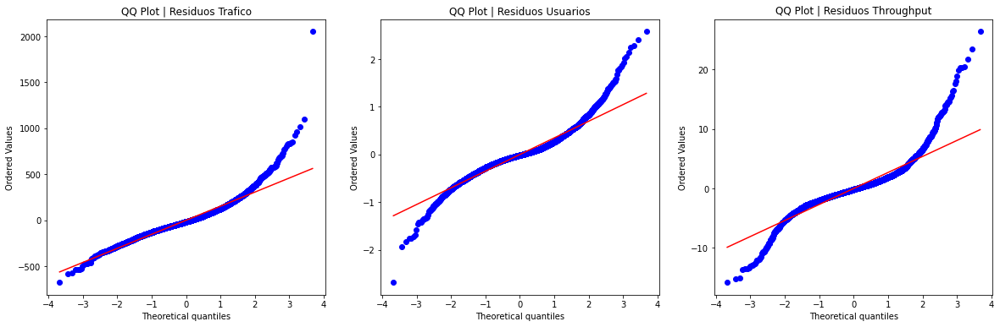

In [ ]:
plt.figure(figsize=(20,6))
plt.subplot(1,3,1)
scipy.stats.probplot(model_fitted.resid['trafico_norm'], plot = plt)
plt.title("QQ Plot | Residuos Trafico", size = 12)

plt.subplot(1,3,2)
scipy.stats.probplot(model_fitted.resid['user_norm'], plot = plt)
plt.title("QQ Plot | Residuos Usuarios", size = 12)

plt.subplot(1,3,3)
scipy.stats.probplot(model_fitted.resid['thp_norm'], plot = plt)
plt.title("QQ Plot | Residuos Throughput", size = 12)

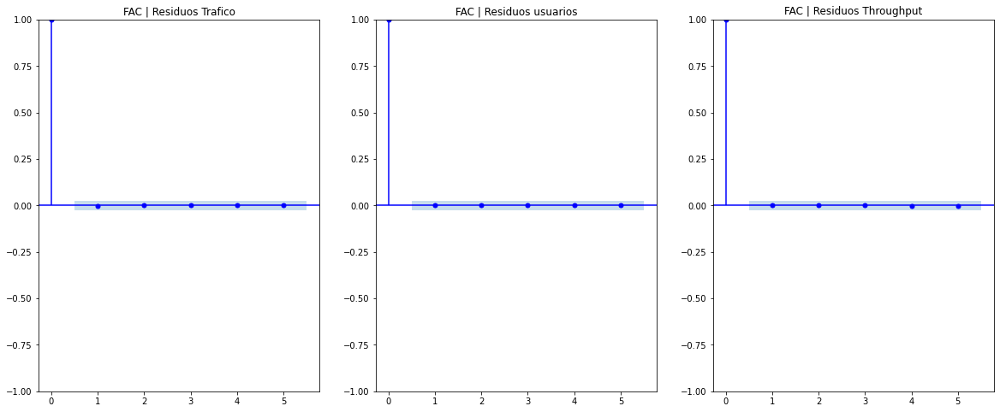

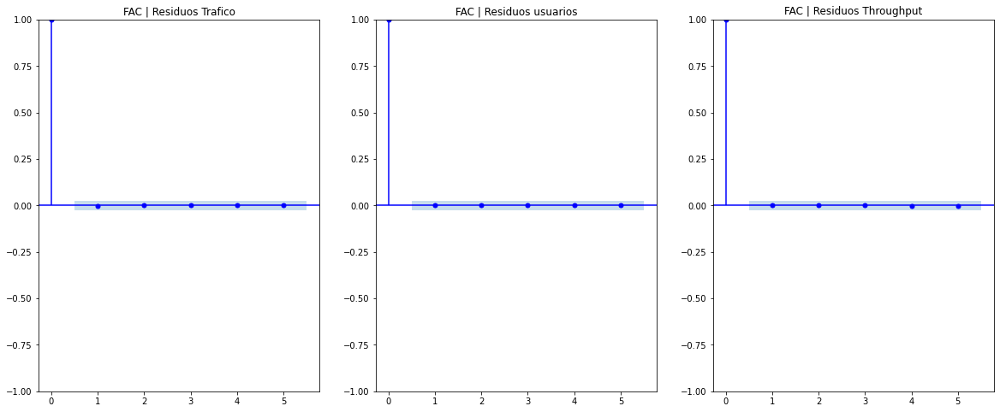

In [ ]:
p1, axes=plt.subplots(1,3,figsize=(20,8),sharex=True, sharey=False )
# axes[2].set_xlabel('Lag')
plot_acf(model_fitted.resid['trafico_norm'], lags=5, ax= axes[0], color='blue', label="ACF", vlines_kwargs={"colors":'blue'}, title='FAC | Residuos Trafico')
plot_acf(model_fitted.resid['user_norm'], lags=5, ax= axes[1], color='blue', label="ACF", vlines_kwargs={"colors":'blue'}, title='FAC | Residuos usuarios')
plot_acf(model_fitted.resid['thp_norm'], lags=5, ax= axes[2], color='blue', label="ACF", vlines_kwargs={"colors":'blue'}, title='FAC | Residuos Throughput')

## 8.8 Prediccion

In [ ]:
futuro = 24*4
lag_orden = 9

pred = model_fitted.forecast_interval(df[df['split']=='train'][['trafico_norm','user_norm','thp_norm']].values[-lag_orden:], steps=futuro)

In [ ]:
pred_mean=pd.DataFrame(pred[0],columns=['pred_mean_trafico_norm','pred_mean_user_norm','pred_mean_thp_norm'])
pred_lower=pd.DataFrame(pred[1],columns=['pred_lower_trafico_norm','pred_lower_user_norm','pred_lower_thp_norm'])
pred_up=pd.DataFrame(pred[2],columns=['pred_up_trafico_norm','pred_up_user_norm','pred_up_thp_norm'])

In [ ]:
# Genero dataset de prediccion
df_pred=pd.concat([pred_lower,pred_mean,pred_up],axis=1)

# Le seteo el index para que le quede las fechas del test
df_pred.set_index(df[df['split']=='test'].index,inplace=True)

#Incorporo las predicciones como columnas del dataset original
df=pd.concat([df,df_pred],axis=1)

In [ ]:
df['pred_lower_Trafico'] = df['pred_lower_trafico_norm']+df['trafico_sint']
df['pred_mean_Trafico'] = df['pred_mean_trafico_norm']+df['trafico_sint']
df['pred_up_Trafico'] = df['pred_up_trafico_norm']+df['trafico_sint']

df['pred_lower_Usuario'] = df['pred_lower_user_norm']+df['user_sint']
df['pred_mean_Usuario'] = df['pred_mean_user_norm']+df['user_sint']
df['pred_up_Usuario'] = df['pred_up_user_norm']+df['user_sint']

df['pred_lower_Thrp'] = df['pred_lower_thp_norm']+df['thp_sint']
df['pred_mean_Thrp'] = df['pred_mean_thp_norm']+df['thp_sint']
df['pred_up_Thrp'] = df['pred_up_thp_norm']+df['thp_sint']


### Trafico

In [ ]:
fig = go.Figure()

train_limitado=df[df['split']=='train'].iloc[-10*24*4:]

fig.add_trace(go.Scatter(x=train_limitado.index, y=train_limitado['DL_Traffic'],mode='lines',line=dict(color="#1E2FF6", width=3),name='Train'))
fig.add_trace(go.Scatter(x=df[df['split']=='test'].index, y=df[df['split']=='test']['DL_Traffic'],mode='lines', line=dict(color="#FF0000", width=3),name='Test'))

fig.add_trace(go.Scatter(x=df[df['split']=='test'].index, y=df.loc[df[df['split']=='test'].index,'pred_mean_Trafico'],
                         mode='lines',line=dict(color='rgba(0, 0, 0,1)', width=3),name='Prediction'))
fig.add_traces([go.Scatter(x = df[df['split']=='test'].index, y = df.loc[df[df['split']=='test'].index,'pred_lower_Trafico'],
                                  mode = 'lines', line=dict(color='rgba(0,0,0,0.5)', width=1),showlegend = False),
                        go.Scatter(x = df[df['split']=='test'].index, y = df.loc[df[df['split']=='test'].index,'pred_up_Trafico'],
                                  mode = 'lines', line=dict(color='rgba(0,0,0,0.5)', width=1),
                                  name = '95% confidence interval',fill='tonexty', fillcolor = 'rgba(0, 0, 0, 0.2)')])

fig.update_layout(height=500, width=1000, title_text="Predicción Trafico",legend=dict(orientation="h", yanchor="bottom",y=1.02,xanchor="right",x=1))
fig.show()

###Usuarios

In [ ]:
fig = go.Figure()

train_limitado=df[df['split']=='train'].iloc[-10*24*4:]

fig.add_trace(go.Scatter(x=train_limitado.index, y=train_limitado['User_Active_DL_Avg'],mode='lines',line=dict(color="#1E2FF6", width=3),name='Train'))
fig.add_trace(go.Scatter(x=df[df['split']=='test'].index, y=df[df['split']=='test']['User_Active_DL_Avg'],mode='lines', line=dict(color="#FF0000", width=3),name='Test'))

fig.add_trace(go.Scatter(x=df[df['split']=='test'].index, y=df.loc[df[df['split']=='test'].index,'pred_mean_Usuario'],
                         mode='lines',line=dict(color='rgba(0, 0, 0,1)', width=3),name='Prediction'))
fig.add_traces([go.Scatter(x = df[df['split']=='test'].index, y = df.loc[df[df['split']=='test'].index,'pred_lower_Usuario'],
                                  mode = 'lines', line=dict(color='rgba(0,0,0,0.5)', width=1),showlegend = False),
                        go.Scatter(x = df[df['split']=='test'].index, y = df.loc[df[df['split']=='test'].index,'pred_up_Usuario'],
                                  mode = 'lines', line=dict(color='rgba(0,0,0,0.5)', width=1),
                                  name = '95% confidence interval',fill='tonexty', fillcolor = 'rgba(0, 0, 0, 0.2)')])

fig.update_layout(height=500, width=1000, title_text="Predicción Usuarios",legend=dict(orientation="h", yanchor="bottom",y=1.02,xanchor="right",x=1))
fig.show()

### Throughput

In [ ]:
fig = go.Figure()

train_limitado=df[df['split']=='train'].iloc[-10*24*4:]

fig.add_trace(go.Scatter(x=train_limitado.index, y=train_limitado['Throughput_User_Dl'],mode='lines',line=dict(color="#1E2FF6", width=3),name='Train'))
fig.add_trace(go.Scatter(x=df[df['split']=='test'].index, y=df[df['split']=='test']['Throughput_User_Dl'],mode='lines', line=dict(color="#FF0000", width=3),name='Test'))

fig.add_trace(go.Scatter(x=df[df['split']=='test'].index, y=df.loc[df[df['split']=='test'].index,'pred_mean_Thrp'],
                         mode='lines',line=dict(color='rgba(0, 0, 0,1)', width=3),name='Prediction'))
fig.add_traces([go.Scatter(x = df[df['split']=='test'].index, y = df.loc[df[df['split']=='test'].index,'pred_lower_Thrp'],
                                  mode = 'lines', line=dict(color='rgba(0,0,0,0.5)', width=1),showlegend = False),
                        go.Scatter(x = df[df['split']=='test'].index, y = df.loc[df[df['split']=='test'].index,'pred_up_Thrp'],
                                  mode = 'lines', line=dict(color='rgba(0,0,0,0.5)', width=1),
                                  name = '95% confidence interval',fill='tonexty', fillcolor = 'rgba(0, 0, 0, 0.2)')])

fig.update_layout(height=500, width=1000, title_text="Predicción Throughput",legend=dict(orientation="h", yanchor="bottom",y=1.02,xanchor="right",x=1))
fig.show()

## 8.9 Evaluación con metricas

In [ ]:
evaluar_metricas(df[df['split']=='test']['DL_Traffic'],df[df['split']=='test']['pred_mean_Trafico'])

MSE: 58732.030090259876
MAE: 197.3741301208304
RMSE: 242.34692094239588
MAPE: 1.1971


In [ ]:
evaluar_metricas(df[df['split']=='test']['User_Active_DL_Avg'],df[df['split']=='test']['pred_mean_Usuario'])

MSE: 0.5766460564831295
MAE: 0.6001592039068439
RMSE: 0.7593721462386737
MAPE: 1.931


In [ ]:
evaluar_metricas(df[df['split']=='test']['Throughput_User_Dl'],df[df['split']=='test']['pred_mean_Thrp'])

MSE: 22.90687821133011
MAE: 3.547212495760028
RMSE: 4.786113058770145
MAPE: 0.2512
